In [1]:
import os

import numpy as np

import nengo
from nengo.neurons import *
from nengo.builder.neurons import *
from nengo.params import Default, NumberParam
from nengo.utils.matplotlib import rasterplot
from nengo.dists import Uniform
from nengo.solvers import LstsqL2, NoSolver
from nengo.utils.numpy import rmse

from nengolib.signal import s, nrmse, LinearSystem
from nengolib.synapses import Lowpass
from nengolib.stats import sphere

import matplotlib.pyplot as plt
import seaborn as sns
sns.set(context='poster', style='whitegrid')
%matplotlib inline

# Utilities

In [2]:
def make_stimulus(signal, freq, amp, seed):       
    if signal == 'cos':
        return nengo.Node(output=lambda t: np.cos(freq*t))
    elif signal == 'sin':
        return nengo.Node(output=lambda t: np.sin(freq*t))
    elif signal == 'ramp':
        return nengo.Node(output=lambda t: 1.0/freq*(t<freq))
    elif signal == 'white_noise':
        return nengo.Node(nengo.processes.WhiteSignal(
            period=100,
            high=freq,
            rms=amp,
            seed=seed))


def norms(signal, freq, amp, ss, tau, t, plot=False):
    lpf=Lowpass(tau)
    with nengo.Network() as model:
        stim = make_stimulus(signal, freq, amp, ss)
        p_stim = nengo.Probe(stim, synapse=None)
        p_integral = nengo.Probe(stim, synapse=1/s)
    with nengo.Simulator(model, progress_bar=False) as sim:
        sim.run(t, progress_bar=False)
    stimulus = sim.data[p_stim]
    target = sim.data[p_integral]
    target_f = lpf.filt(sim.data[p_integral])
    norm_s = np.max(np.abs(stimulus))
    norm = np.max(np.abs(target))
    norm_f = np.max(np.abs(target_f))
    if plot:
        plt.plot(sim.trange(), stimulus)
        plt.plot(sim.trange(), target)
        plt.plot(sim.trange(), lpf.filt(sim.data[p_integral]/norm_f))
        plt.show()
    return norm, norm_s, norm_f


def bin_activities_values_1d(
    xhat_pre,
    act_bio,
    x_min=-1,
    x_max=1,
    n_neurons=10,
    n_eval_points=20):

    def find_nearest(array,value):
        idx = (np.abs(array-value)).argmin()
        return idx

    x_bins = np.linspace(x_min, x_max, num=n_eval_points)
    hz_means = np.empty((n_neurons, n_eval_points))
    hz_stds = np.empty((n_neurons, n_eval_points))
    for i in range(n_neurons):
        bin_act = [[] for _ in range(x_bins.shape[0])]
        for t in range(act_bio.shape[0]):
            idx = find_nearest(x_bins, xhat_pre[t])
            bin_act[idx].append(act_bio[t, i])
        for x in range(len(bin_act)):
            hz_means[i, x] = np.average(bin_act[x])
            hz_stds[i, x] = np.std(bin_act[x])

    return x_bins, hz_means, hz_stds


def get_kwargs(
    n_neurons=10,
    n_pre=100,
    n_adapt=100,
    JL_dims=0,
    taus={'network': 0.1,
          'readout': 0.1},
    max_rates=Uniform(200, 400),
    neuron_type=nengo.LIF(),
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5}):
    
    rng=np.random.RandomState(seed=seeds['es'])
    encoders = sphere.sample(n_neurons, 1, rng=rng)
    if JL_dims > 0:
        encoders = np.hstack((
            encoders, sphere.sample(n_neurons, JL_dims, rng=rng)))
    assert encoders.shape == (n_neurons, JL_dims+1)
    
    pre_kwargs = dict(
        n_neurons=n_pre,
        dimensions=1,
        max_rates=max_rates,
        seed=seeds['es'])
    lif_kwargs = dict(
        n_neurons=n_neurons,
        dimensions=1,
        max_rates=max_rates,
        neuron_type=nengo.LIF(),
        seed=seeds['es'],
        label='lif')
    adapt_kwargs = dict(
        n_neurons=1,
        neuron_type=nengo.Direct(),
#         n_neurons=n_adapt,
#         neuron_type=nengo.LIFRate(),
#         radius=5,
        dimensions=n_neurons,
        max_rates=max_rates,
        seed=seeds['es'])
    bio_kwargs = dict(
        n_neurons=n_neurons,
        dimensions=1+JL_dims,
        encoders=encoders,
        normalize_encoders=False,
        max_rates=max_rates,
        neuron_type=neuron_type,
        seed=seeds['es'],
        label='bio')
    
    return pre_kwargs, adapt_kwargs, lif_kwargs, bio_kwargs

def install_tuning_curves(ens):
    """Use ens.seed to set ens.{encoders, max_rates, intercepts, gain, bias}."""
    rng = np.random.RandomState(ens.seed)
    #ens.encoders = ens.encoders.sample(ens.n_neurons, ens.dimensions, rng=rng)
    ens.max_rates = ens.max_rates.sample(ens.n_neurons, rng=rng)
    ens.intercepts = ens.intercepts.sample(ens.n_neurons, rng=rng)
    ens.gain, ens.bias = ens.neuron_type.gain_bias(
        ens.max_rates, ens.intercepts)

# Network

In [3]:
def simulate(  
    d_supv,
    d_bio,
    d_JL,
    d_supv_adapt,
    d_bio_adapt,
    d_adapt_bio,
    t=1,
    dt=0.001,
    n_neurons=100,
    n_pre=100,
    n_adapt=1,
    n_neurons_plot=10,
    signal='cos',
    freq=1,
    amp=1,
    reg=0.1,
    reg_adapt=0.1,
    taus={'network': 0.1,
          'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    neuron_type=nengo.AdaptiveLIFRate(tau_n=0.1, inc_n=0.01),
    max_rates=Uniform(200, 400),
    plot_supv=False,
    plot_bio=False,
    sim_supv=False,
    sim_bio=False,
    update_decoders=False):
    
    # transform input signal u so that the integral x is normalized to np.max(x)==1
    norm, norm_s, norm_f = norms(signal, freq, amp, seeds['ss'], taus['network'], t)
    # keyword arguments for ensembles and connections
    pre_kwargs, adapt_kwargs, lif_kwargs, bio_kwargs = get_kwargs(
        n_neurons, n_pre, n_adapt, d_JL.shape[1], taus, max_rates, neuron_type, seeds)
    
    # Simulate the full network, skipping simulation of supv or bio when possible.
    with nengo.Network(seed=seeds['ns']) as model:
        u = make_stimulus(signal, freq, amp, seed=seeds['ss'])
        pre_u = nengo.Ensemble(radius=norm_s, **pre_kwargs)
        pre_x = nengo.Ensemble(radius=norm, **pre_kwargs)
        if sim_supv:
            supv = nengo.Ensemble(**bio_kwargs)
            install_tuning_curves(supv)
        if sim_bio:
            bio = nengo.Ensemble(**bio_kwargs)
            install_tuning_curves(bio)
        adapt = nengo.Ensemble(**adapt_kwargs)
        lif = nengo.Ensemble(**lif_kwargs)
        tar = nengo.Ensemble(1, 1, neuron_type=nengo.Direct())

        # normal connections
        nengo.Connection(u, pre_u, synapse=None, seed=seeds['cs'])
        nengo.Connection(u, pre_x, synapse=1/s, seed=seeds['cs'])
        nengo.Connection(u, tar, synapse=1/s, transform=1.0/norm_f)
        nengo.Connection(pre_u, lif, synapse=taus['network'], transform=taus['network']/norm_f)
#         nengo.Connection(pre_x, lif, synapse=taus['network'], transform=1.0/norm_f)  # proxy for accuracy
        nengo.Connection(lif, lif, synapse=taus['network'])
        
        # bio connections
        if sim_supv:
            pre_u_supv = nengo.Connection(pre_u, supv[0], synapse=taus['network'], transform=taus['network']/norm_f)
            pre_x_supv = nengo.Connection(pre_x, supv[0], synapse=taus['network'], transform=1.0/norm_f)
        if sim_bio:
            pre_u_bio = nengo.Connection(pre_u, bio[0], synapse=taus['network'], transform=taus['network']/norm_f)
            bio_bio = nengo.Connection(bio, bio, synapse=taus['network'],
                solver=NoSolver(np.hstack((d_bio, d_JL))), seed=seeds['cs'])
        if sim_supv and sim_bio:
            supv_bio = nengo.Connection(supv, bio, synapse=taus['network'],
                solver=NoSolver(np.hstack((d_supv, d_JL))), seed=seeds['cs'])
            
        # adaptation connections
        if sim_supv and not sim_bio:
            supv_adapt = nengo.Connection(supv, adapt, synapse=None,
                solver=NoSolver(d_supv_adapt),
                function=lambda _: [0 for _ in range(n_neurons)])
        if sim_bio:
            def my_I(x):
#                 print np.dot(x, d_adapt_bio)
                return np.dot(x, d_adapt_bio)
            bio_adapt = nengo.Connection(bio, adapt, synapse=None,
                solver=NoSolver(d_bio_adapt),
                function=lambda _: [0 for _ in range(n_neurons)])
            adapt_bio = nengo.Connection(adapt, bio, synapse=taus['network'],
#                 solver=NoSolver(d_adapt_bio),
                function=my_I)
        # probes
        p_stim = nengo.Probe(u, synapse=None)
        p_target = nengo.Probe(tar, synapse=None)
        if sim_supv:
            p_spk_supv = nengo.Probe(supv.neurons, synapse=None)
            p_adapt_target = nengo.Probe(supv.neurons, 'adaptation', synapse=None)
        if sim_bio:
            p_spk_bio = nengo.Probe(bio.neurons, synapse=None)
            p_adapt_target = nengo.Probe(bio.neurons, 'adaptation', synapse=None)
        p_adapt = nengo.Probe(adapt, synapse=None)
        p_spk_lif = nengo.Probe(lif.neurons)
        p_act_lif = nengo.Probe(lif.neurons, synapse=taus['readout'])
        p_lif = nengo.Probe(lif, synapse=taus['readout'])
        

    # Run the simulation
    with nengo.Simulator(model, seed=seeds['ss'], dt=dt) as sim:
        sim.run(t)

    # Collect spikes, activities and lif estimates
    print "collecting simulation data ..."
    lpf = Lowpass(taus['readout'])
    stim = lpf.filt(sim.data[p_stim])
    target = lpf.filt(sim.data[p_target])
    if sim_supv:
        spikes_supv = sim.data[p_spk_supv]
        act_supv = lpf.filt(spikes_supv)
    if sim_bio:
        spikes_bio = sim.data[p_spk_bio]
        act_bio = lpf.filt(spikes_bio)
    adapt_target = lpf.filt(sim.data[p_adapt_target])
    xhat_adapt = lpf.filt(sim.data[p_adapt])
    spikes_lif = sim.data[p_spk_lif]
    act_lif = sim.data[p_act_lif]
    xhat_lif = sim.data[p_lif]
    nrmse_lif = nrmse(xhat_lif, target=target)
    x_bins_lif, hz_means_lif, hz_stds_lif = bin_activities_values_1d(
        target, act_lif, n_neurons=n_neurons)

    # Compute new decoders
    print "training and saving decoders and filters ..."       
    if sim_supv and update_decoders:
        d_supv_new = LstsqL2(reg=reg)(act_supv, target)[0]
        d_supv_adapt_new = LstsqL2(reg=reg)(act_supv, adapt_target)[0]
    else:
        d_supv_new = d_supv
        d_supv_adapt_new = d_supv_adapt
    if sim_bio and update_decoders:
        d_bio_new = LstsqL2(reg=reg)(act_bio, target)[0]
        d_bio_adapt_new = LstsqL2(reg=reg)(act_bio, adapt_target)[0]
    else:
        d_bio_new = d_bio
        d_bio_adapt_new = d_bio_adapt
    

    # Compute xhat then bin data for tuning curve estimation
    print "computing xhat from updated decoders/filters ..."
    if sim_supv:
        xhat_supv = np.dot(act_supv, d_supv_new)
        nrmse_supv = nrmse(xhat_supv, target=target)
        x_bins_supv, hz_means_supv, hz_stds_supv = bin_activities_values_1d(
            target, act_supv, n_neurons=n_neurons)
    if sim_bio:
        xhat_bio = np.dot(act_bio, d_bio_new)
        nrmse_bio = nrmse(xhat_bio, target=target)
        x_bins_bio, hz_means_bio, hz_stds_bio = bin_activities_values_1d(
            target, act_bio, n_neurons=n_neurons)
        error = target - xhat_bio
#         error = xhat_bio - target
        
    xhat_adapt_control = np.dot(xhat_adapt, d_adapt_bio)
    if sim_bio and update_decoders and np.sum(xhat_adapt) > 0:
        d_adapt_bio_new = LstsqL2(reg=reg_adapt)(xhat_adapt, error)[0]
    else:
        d_adapt_bio_new = d_adapt_bio

    # Plot 'em, mash 'em, stick 'em in a stew
    print "plotting ..."
    if plot_supv and sim_supv:
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 8))
        rasterplot(sim.trange(), spikes_supv, ax=ax1)
        rasterplot(sim.trange(), spikes_lif, ax=ax2)
        ax1.set(ylabel='bio')
        ax2.set(xlabel='time', ylabel='lif')
        plt.tight_layout()
        
#         fig, ax1 = plt.subplots(1, 1, figsize=(8, 8))
#         sns.distplot(np.ravel(act_supv), ax=ax1)
#         ax1.set(xlabel='activity', ylabel='frequency', title='supv')
#         plt.tight_layout()
        
#         fig, ax1 = plt.subplots(1, 1, figsize=(8, 8))
#         if np.sum(np.abs(d_supv)) > 0: sns.distplot(np.ravel(d_supv), ax=ax1, label='old')
#         if np.sum(np.abs(d_supv_new)) > 0: sns.distplot(np.ravel(d_supv_new), ax=ax1, label='new')
#         ax1.set(xlabel='decoder', ylabel='frequency', title='supv')
#         plt.legend()
#         plt.tight_layout()
        
        cmap = sns.color_palette('hls', n_neurons)
        fig, (ax4, ax5) = plt.subplots(1, 2, figsize=(8, 8), sharey=True)
        for n in range(n_neurons_plot):
            ax4.plot(x_bins_lif, hz_means_lif[n], c=cmap[n])
            ax4.fill_between(x_bins_lif,
                hz_means_lif[n]+hz_stds_lif[n],
                hz_means_lif[n]-hz_stds_lif[n],
                alpha=0.5, facecolor=cmap[n])
            ax5.plot(x_bins_supv, hz_means_supv[n], c=cmap[n])
            ax5.fill_between(x_bins_supv,
                hz_means_supv[n]+hz_stds_supv[n],
                hz_means_supv[n]-hz_stds_supv[n],
                alpha=0.5, facecolor=cmap[n])
        ax4.set(xlim=((-1,1)), ylim=((0, max_rates.high)), xlabel='$\mathbf{x}$', ylabel='activity (Hz)', title='lif')
        ax5.set(xlim=((-1,1)), ylim=((0, max_rates.high)), xlabel='$\mathbf{x}$', title='supv')
        plt.tight_layout()
        
        fig, ax = plt.subplots(1, 1, figsize=(8, 4))
        ax.plot(sim.trange(), target, label='target', linestyle='--')
        ax.plot(sim.trange(), xhat_lif, alpha=0.5, label='lif, nrmse=%.3f' %nrmse_lif)
        ax.plot(sim.trange(), xhat_supv, alpha=0.5, label='supv, nrmse=%.3f' %nrmse_supv)
        ax.set(xlabel='time', ylabel='$\mathbf{x}$', title='supv')
        ax.legend(loc='lower left')
        plt.tight_layout()
        
        fig, ax = plt.subplots(1, 1, figsize=(8, 4))
        for n in range(n_neurons_plot):
            ax.plot(sim.trange(), adapt_target[:, n], c=cmap[n], linestyle='--')  #  label='target',
            ax.plot(sim.trange(), xhat_adapt[:, n], c=cmap[n], alpha=0.5)  # , label='xhat_adapt_bio'
        ax.set(xlabel='time', ylabel='adaptation', title='supv')
        ax.legend(loc='lower left')
        plt.tight_layout()
        
        plt.show()

    if plot_bio and sim_bio:
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 8))
        rasterplot(sim.trange(), spikes_bio, ax=ax1)
        rasterplot(sim.trange(), spikes_lif, ax=ax2)
        ax1.set(ylabel='bio')
        ax2.set(xlabel='time', ylabel='lif')
        plt.tight_layout()
        
#         fig, ax1 = plt.subplots(1, 1, figsize=(8, 8))
#         sns.distplot(np.ravel(act_bio), ax=ax1)
#         ax1.set(xlabel='activity', ylabel='frequency', title='bio')
#         plt.tight_layout()
        
#         fig, ax1 = plt.subplots(1, 1, figsize=(8, 8))
#         if np.sum(np.abs(d_bio)) > 0: sns.distplot(np.ravel(d_bio), ax=ax1, label='old')
#         if np.sum(np.abs(d_bio_new)) > 0: sns.distplot(np.ravel(d_bio_new), ax=ax1, label='new')
#         ax1.set(xlabel='decoder', ylabel='frequency', title='bio')
#         plt.legend()
#         plt.tight_layout()
        
        cmap = sns.color_palette('hls', n_neurons_plot)
        fig, (ax4, ax5) = plt.subplots(1, 2, figsize=(8, 8), sharey=True)
        for n in range(n_neurons_plot):
            ax4.plot(x_bins_lif, hz_means_lif[n], c=cmap[n])
            ax4.fill_between(x_bins_lif,
                hz_means_lif[n]+hz_stds_lif[n],
                hz_means_lif[n]-hz_stds_lif[n],
                alpha=0.5, facecolor=cmap[n])
            ax5.plot(x_bins_bio, hz_means_bio[n], c=cmap[n])
            ax5.fill_between(x_bins_bio,
                hz_means_bio[n]+hz_stds_bio[n],
                hz_means_bio[n]-hz_stds_bio[n],
                alpha=0.5, facecolor=cmap[n])
        ax4.set(xlim=((-1,1)), ylim=((0, max_rates.high)), xlabel='$\mathbf{x}$', ylabel='activity (Hz)', title='lif') 
        ax5.set(xlim=((-1,1)), ylim=((0, max_rates.high)), xlabel='$\mathbf{x}$', title='bio') 
        plt.tight_layout()
        
        fig, ax = plt.subplots(1, 1, figsize=(8, 4))
        ax.plot(sim.trange(), target, label='target', linestyle='--')
        ax.plot(sim.trange(), xhat_lif, alpha=0.5, label='lif, nrmse=%.3f' %nrmse_lif)
        ax.plot(sim.trange(), xhat_bio, alpha=0.5, label='bio, nrmse=%.3f' %nrmse_bio)
        ax.plot(sim.trange(), error, alpha=0.5, label='error')
        ax.set(xlabel='time', ylabel='$\mathbf{x}$')
        ax.legend(loc='lower left')
        plt.tight_layout()
        
        fig, ax = plt.subplots(1, 1, figsize=(8, 4))
        for n in range(n_neurons_plot):
            ax.plot(sim.trange(), adapt_target[:, n], c=cmap[n], linestyle='--')  #  label='target',
            ax.plot(sim.trange(), xhat_adapt[:, n], c=cmap[n], alpha=0.5)  # , label='xhat_adapt_bio'
        ax.set(xlabel='time', ylabel='adaptation', title='bio')
        ax.legend(loc='lower left')
        plt.tight_layout()
        
        if np.sum(np.abs(d_adapt_bio_new)) > 0: 
            fig, ax = plt.subplots(1, 1, figsize=(8, 4))
#             ax.plot(sim.trange(), np.dot(act_adapt, d_adapt_bio), linestyle='--')  #  label='target',
            ax.plot(sim.trange(), xhat_adapt_control, linestyle='--')  #  label='target',
            ax.set(xlabel='time', ylabel='adaptive control')
            ax.legend(loc='lower left')
            plt.tight_layout()
        
        plt.show()

    return d_supv_new, d_bio_new, d_supv_adapt_new, d_bio_adapt_new, d_adapt_bio_new

/home/pduggins/.virtualenvs/nengo_bioneuron/local/lib/python2.7/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


Building finished in 0:00:01.                                                   
Simulating finished in 0:00:34.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...
d_bio
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:44.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...
Testing ...
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:25.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


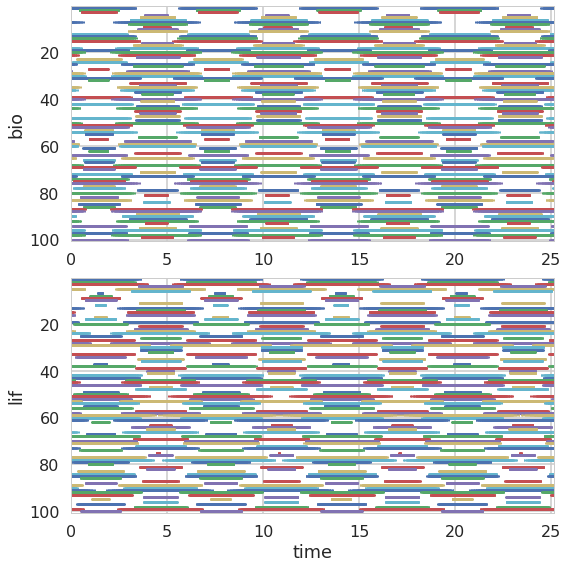

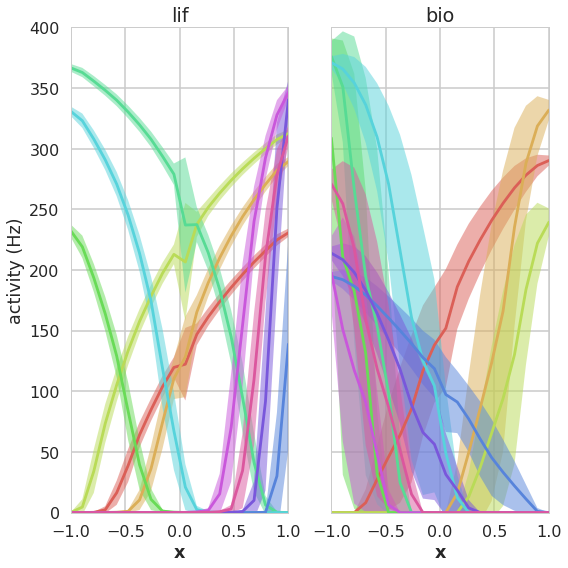

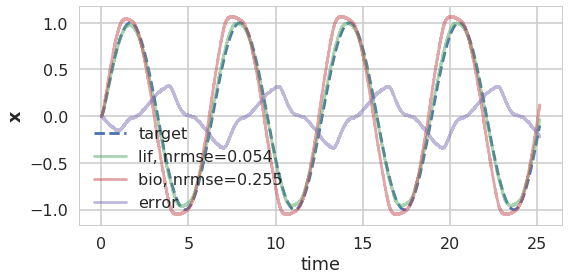

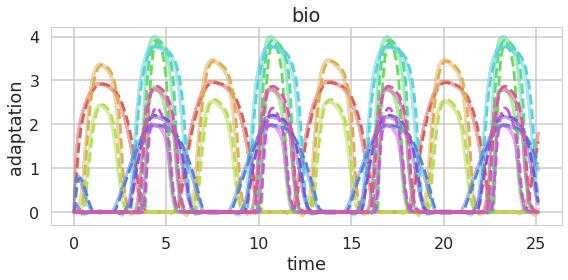

In [4]:
n_neurons = 100
n_pre = 100
n_adapt = 1
freq = 1
taus = {'network': 0.1, 'readout': 0.1}
neuron_type = nengo.AdaptiveLIF(tau_n=0.1, inc_n=0.01)
max_rates = Uniform(200, 400)

reg = 0.1
reg_adapt = 0.01
JL_dims = 0
JL_mag = 0

t1 = 8*np.pi
t2 = 8*np.pi
t3 = 8*np.pi
t4 = 8*np.pi
t5 = 8*np.pi
signal = 'cos'

d_supv = np.zeros((n_neurons, 1))
d_bio = np.zeros((n_neurons, 1))
d_supv_adapt = np.zeros((n_neurons, n_neurons))
d_bio_adapt = np.zeros((n_neurons, n_neurons))
d_JL = np.random.RandomState(seed=1).randn(n_neurons, JL_dims) * JL_mag
d_adapt_bio = np.zeros((n_neurons, 1))

d_supv, _, d_supv_adapt, _, _ = simulate(  
    d_supv,
    d_bio,
    d_JL,
    d_supv_adapt,
    d_bio_adapt,
    d_adapt_bio,
    t=t1,
    n_neurons=n_neurons,
    n_adapt=n_adapt,
    signal=signal,
    freq=freq,
    taus=taus,
    reg=reg,
    neuron_type=neuron_type,
    max_rates=max_rates,
    plot_supv=False,
    plot_bio=False,
    sim_supv=True,
    sim_bio=False,
    update_decoders=True)

print "d_bio"
_, d_bio, _, d_bio_adapt, _ = simulate(  
    d_supv,
    d_bio,
    d_JL,
    d_supv_adapt,
    d_bio_adapt,
    d_adapt_bio,
    t=t2,
    n_neurons=n_neurons,
    n_adapt=n_adapt,
    signal=signal,
    freq=freq,
    taus=taus,
    reg=reg,
    neuron_type=neuron_type,
    max_rates=max_rates,
    plot_supv=False,
    plot_bio=False,
    sim_supv=True,
    sim_bio=True,
    update_decoders=True)

print "Testing ..."
_, _, _, _, _ = simulate(  
    d_supv,
    d_bio,
    d_JL,
    d_supv_adapt,
    d_bio_adapt,
    d_adapt_bio,
    t=t5,
    n_neurons=n_neurons,
    n_adapt=n_adapt,
    signal='cos',
    freq=freq,
    taus=taus,
    neuron_type=neuron_type,
    max_rates=max_rates,
    plot_bio=True,
    sim_bio=True)

Building finished in 0:00:01.                                                   
Simulating finished in 0:00:33.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...
d_bio
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:40.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...
d_adapt_bio
control iteration 0
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:28.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


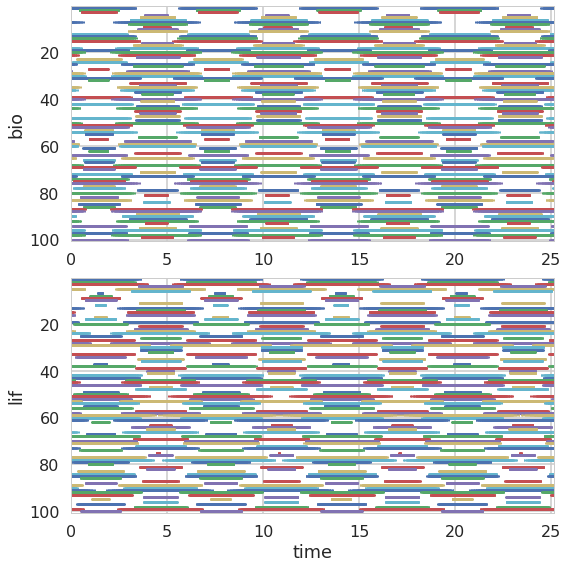

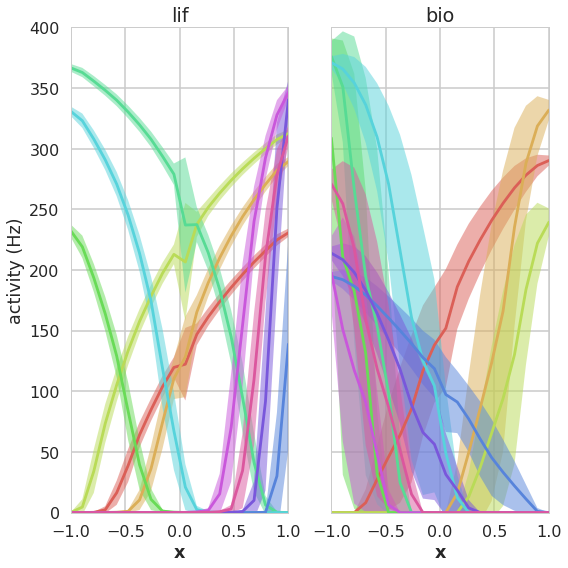

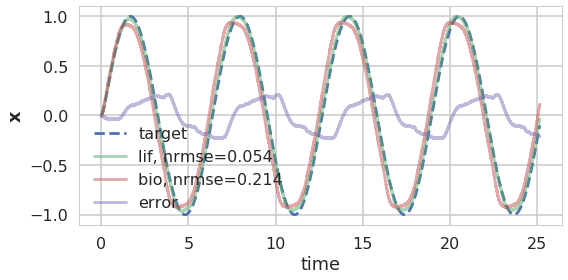

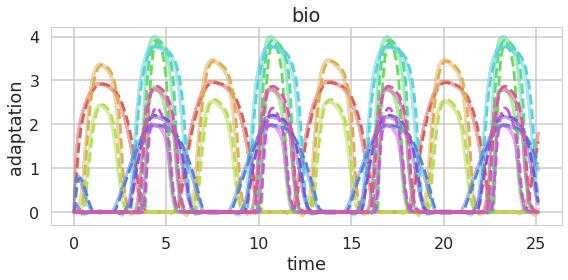

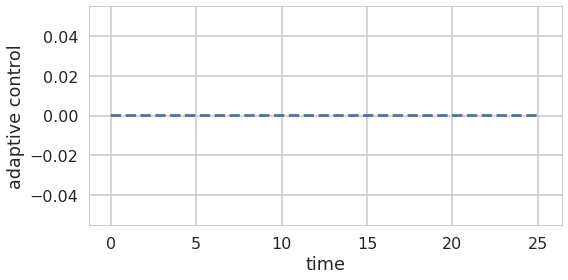

control iteration 1
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:43.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


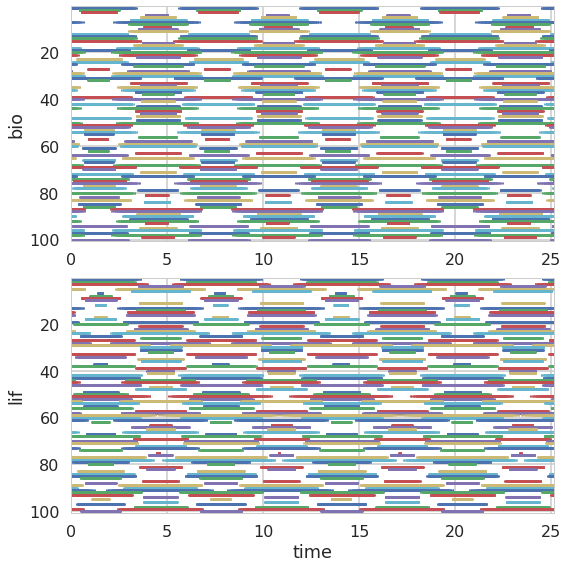

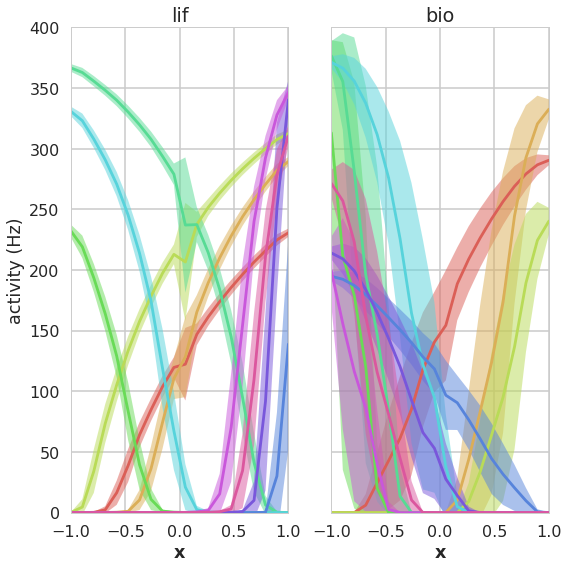

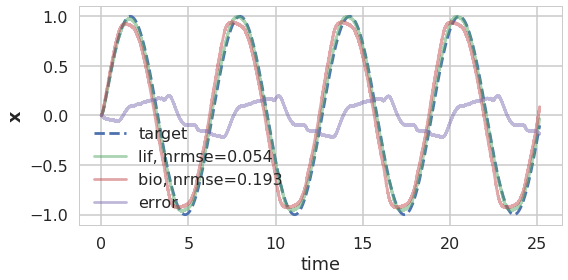

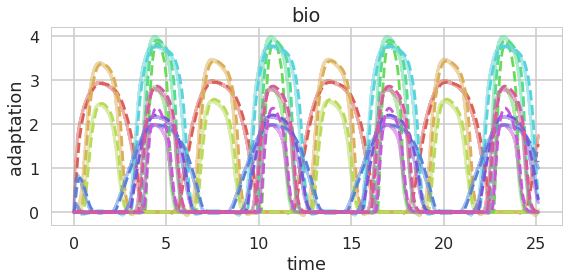

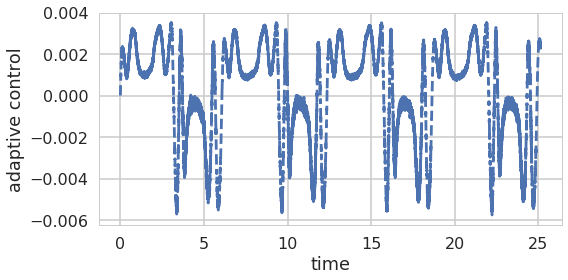

control iteration 2
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:29.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


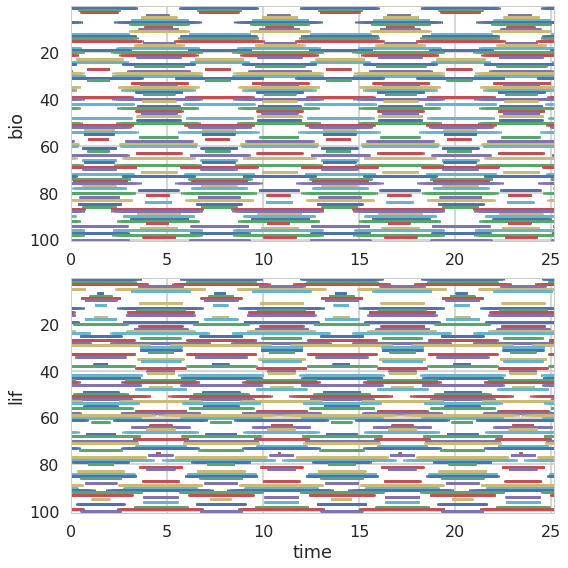

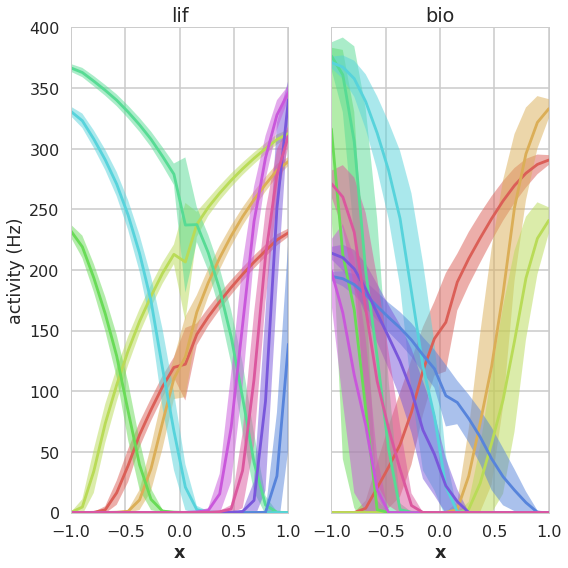

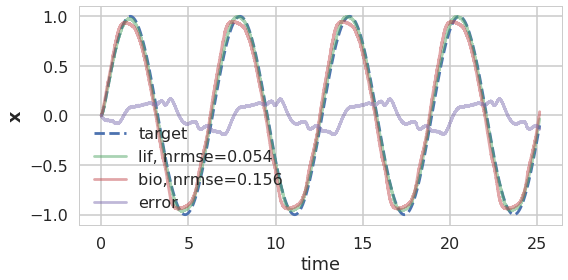

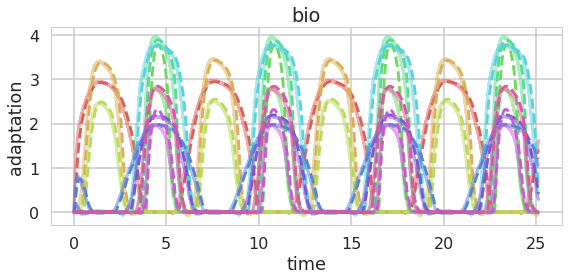

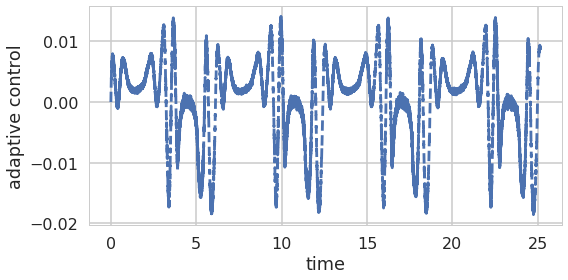

control iteration 3
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:34.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


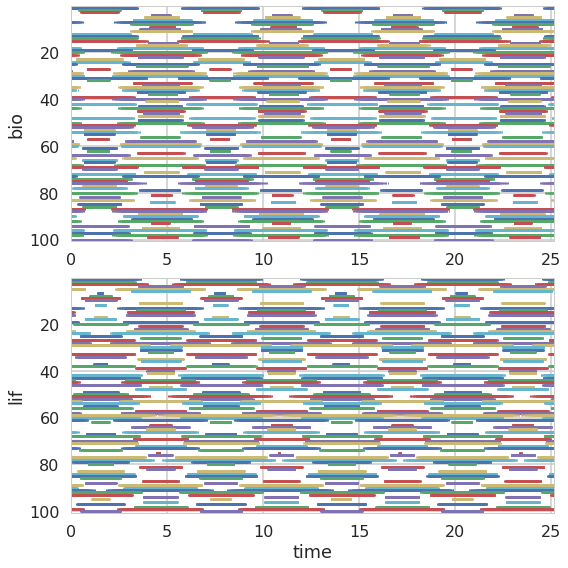

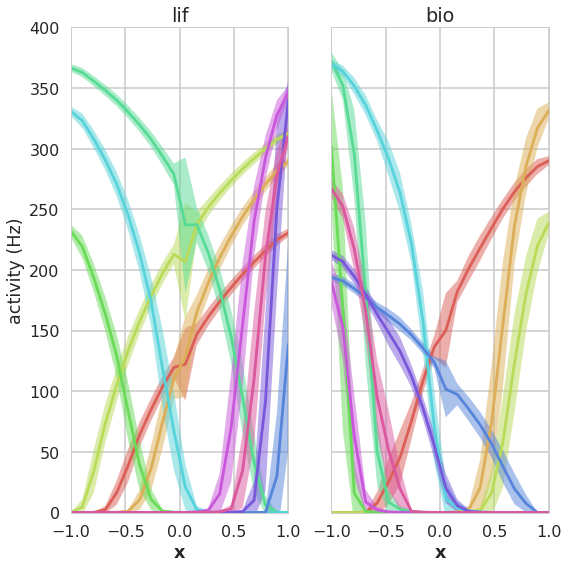

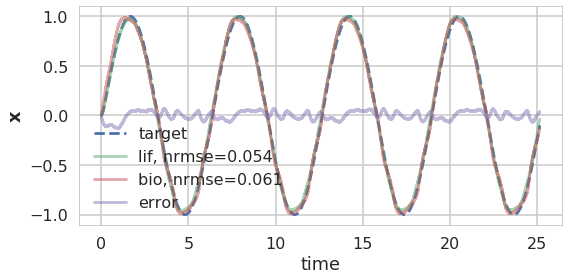

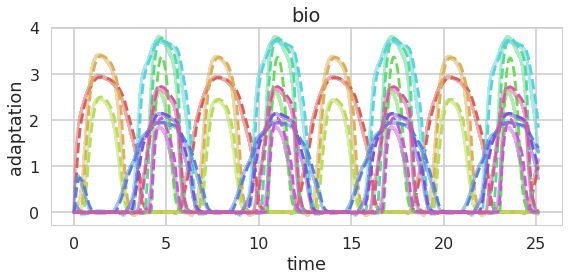

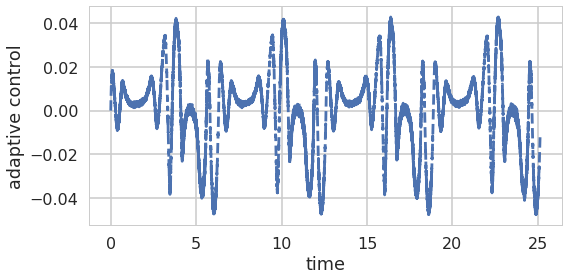

control iteration 4
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:30.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


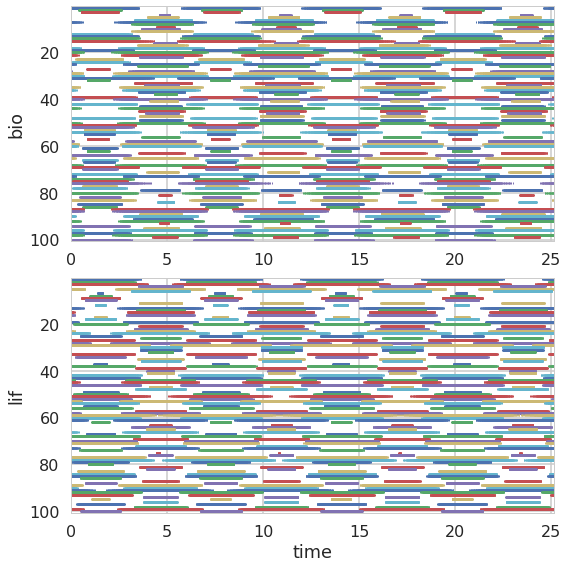

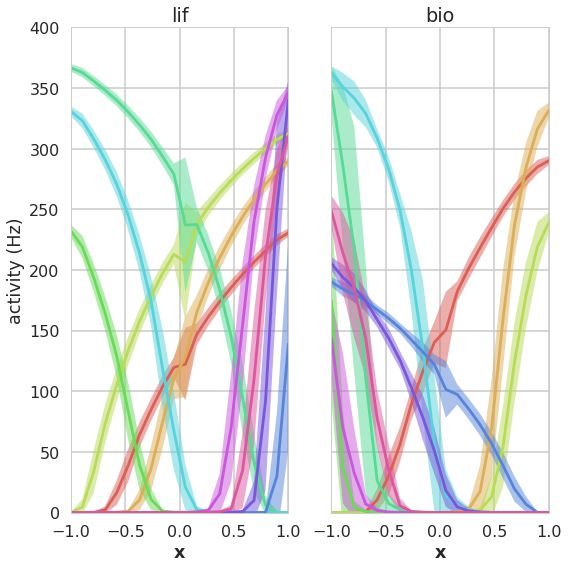

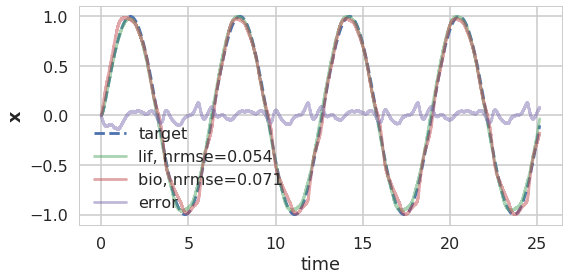

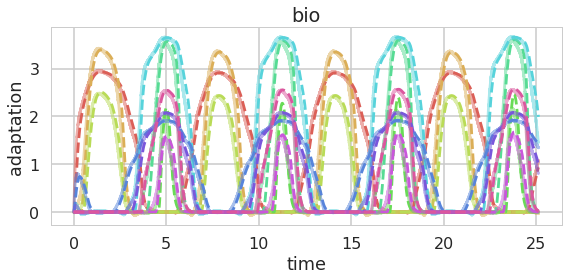

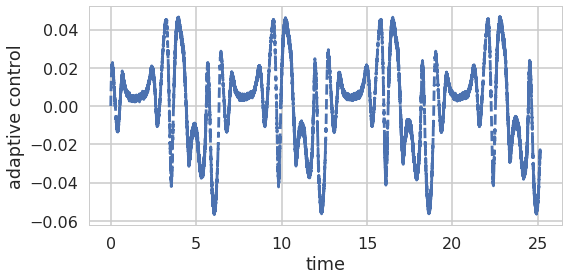

control iteration 5
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:23.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


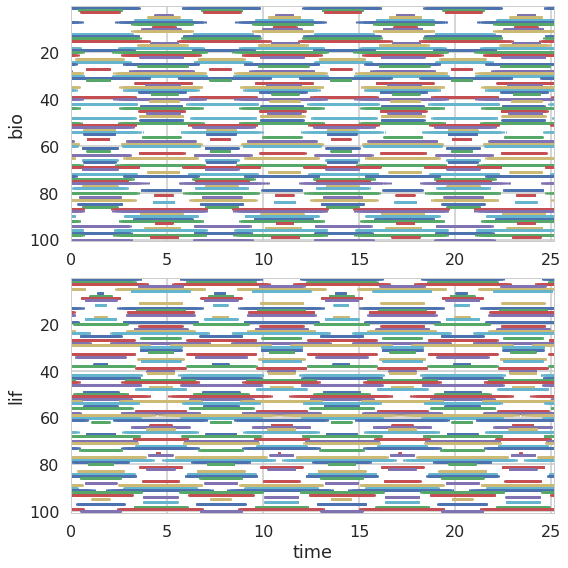

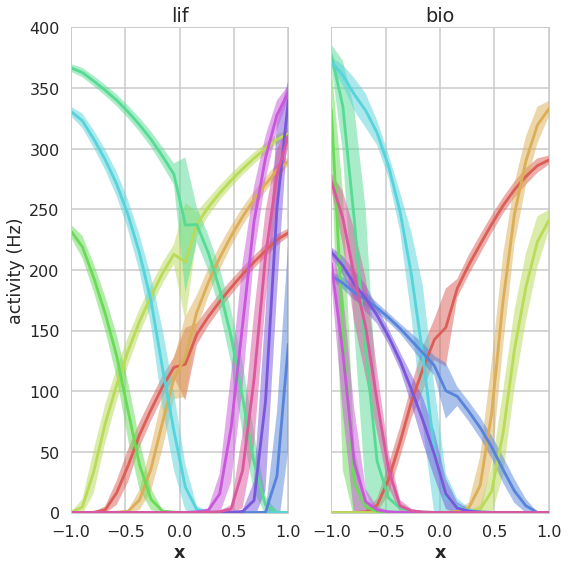

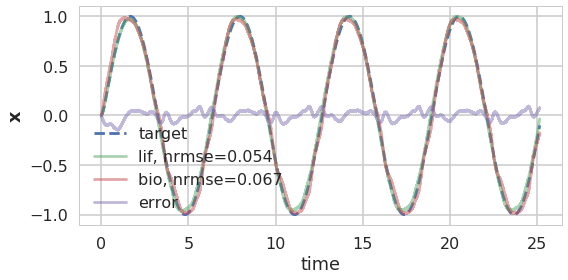

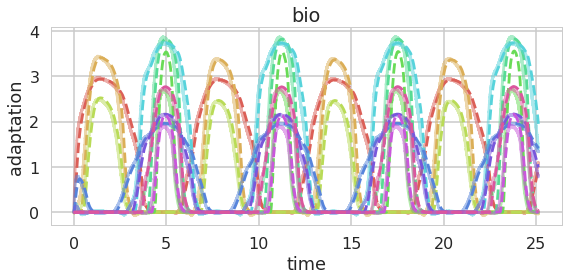

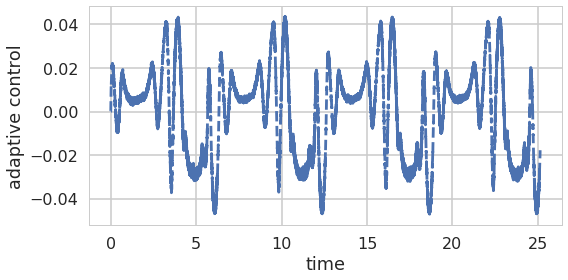

control iteration 6
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:29.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


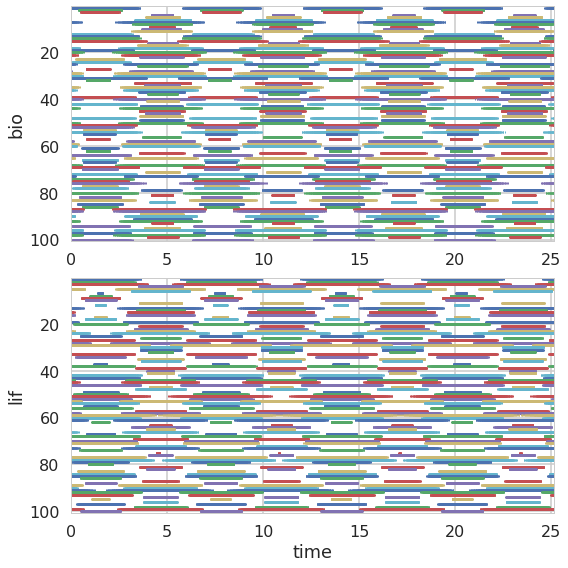

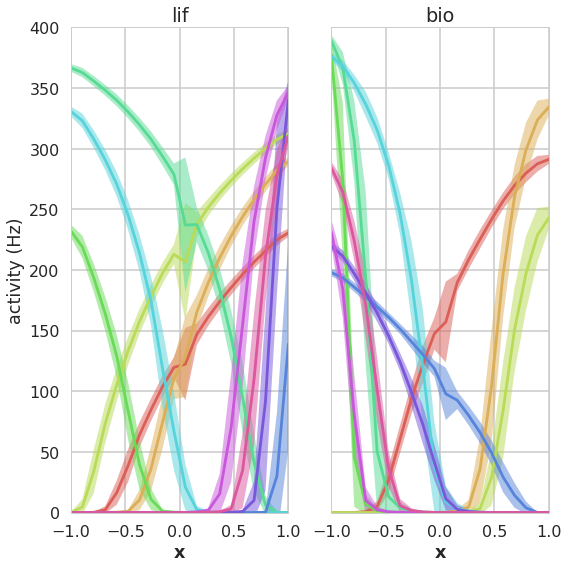

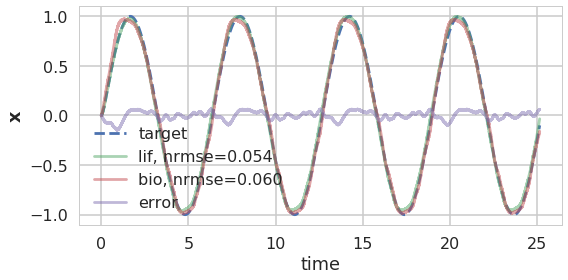

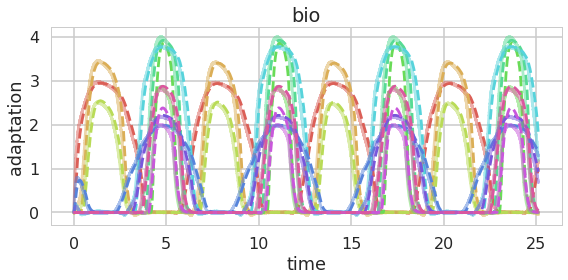

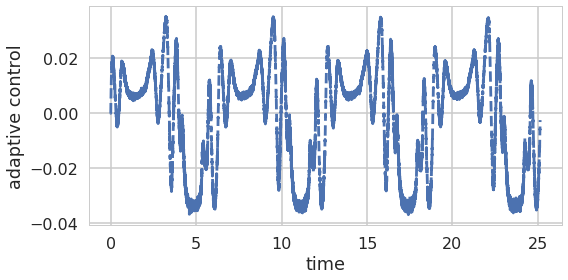

control iteration 7
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:34.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


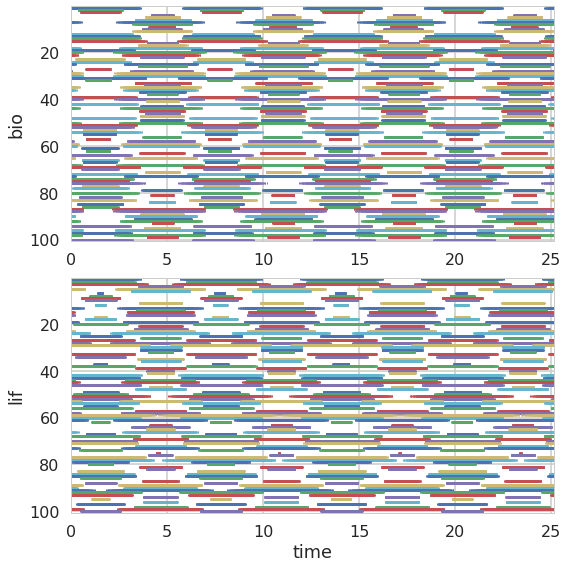

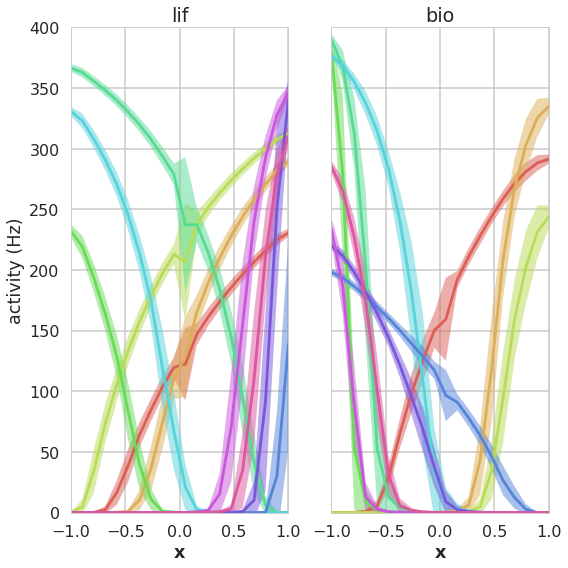

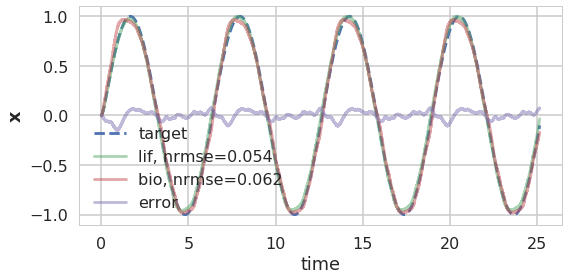

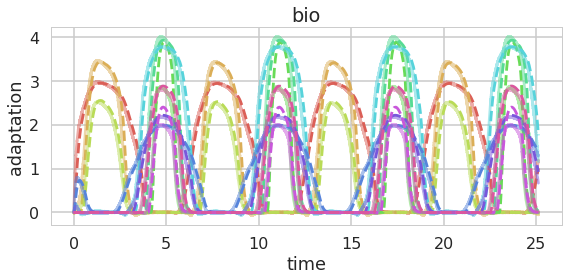

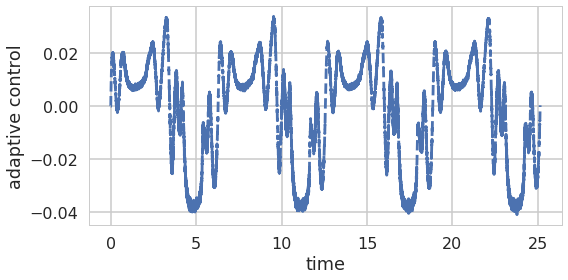

control iteration 8
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:25.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


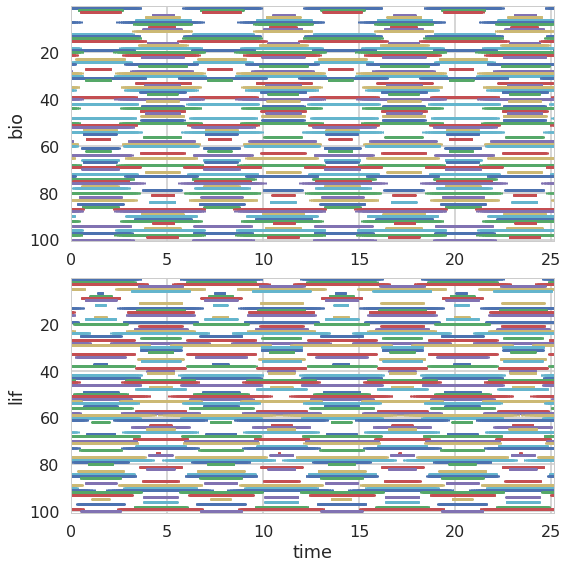

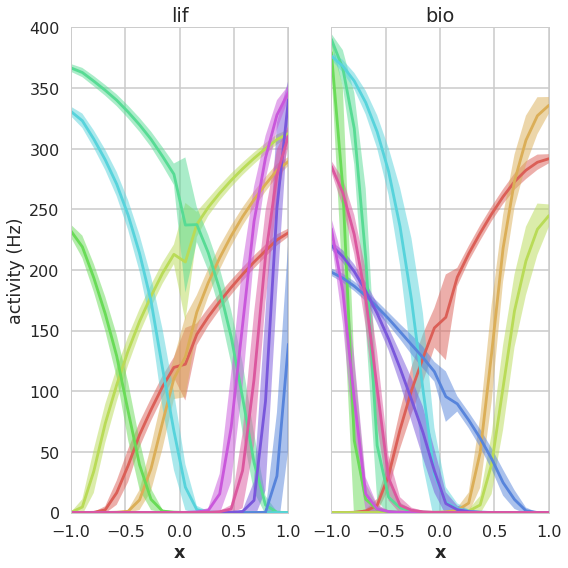

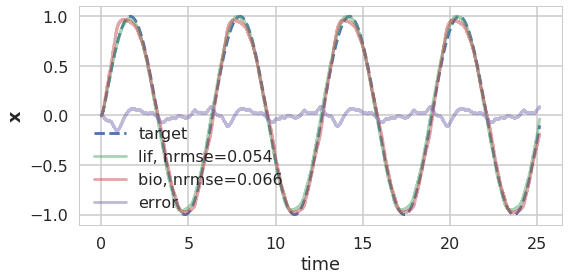

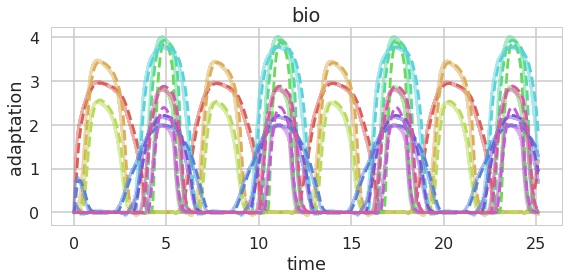

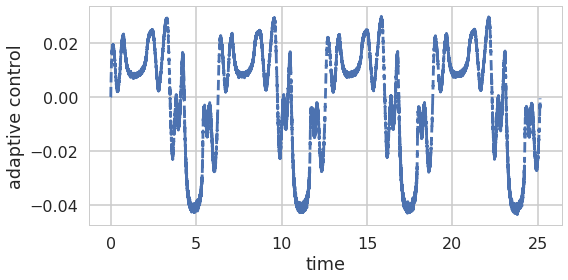

control iteration 9
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:29.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


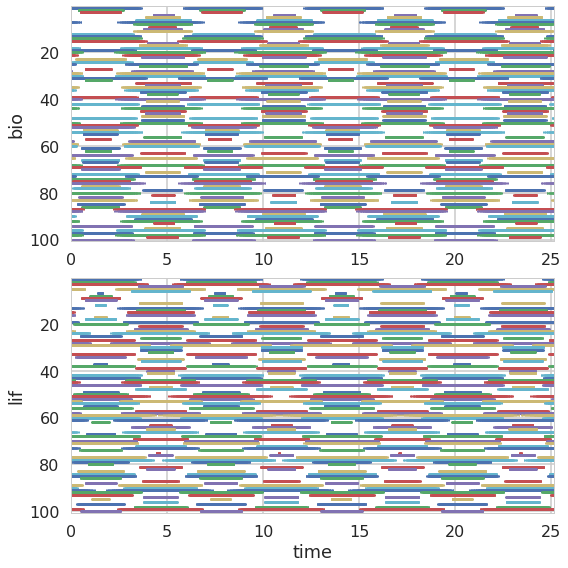

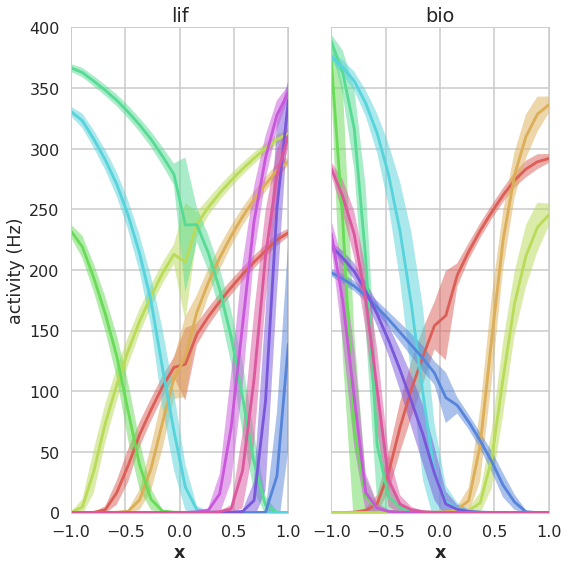

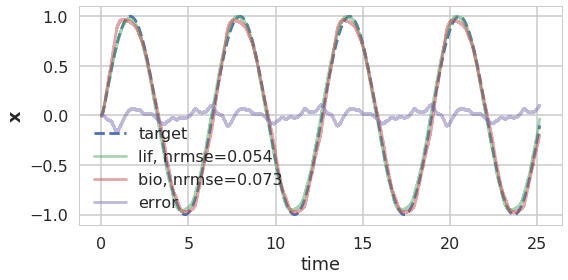

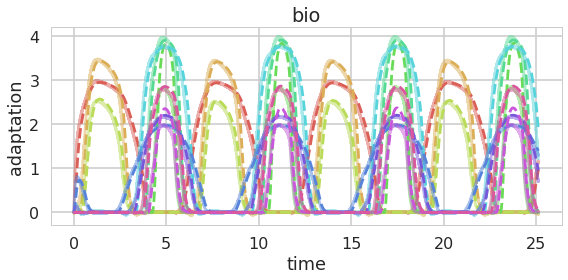

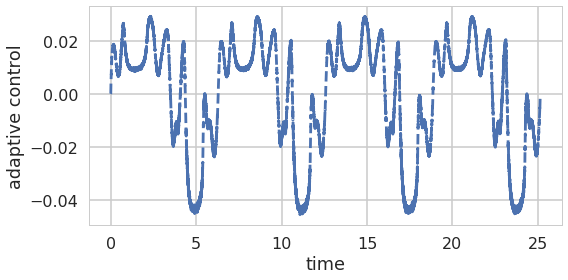

Testing ...
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:31.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


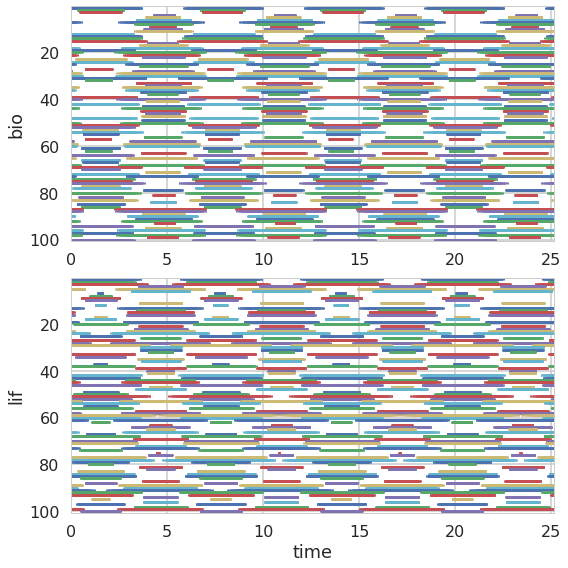

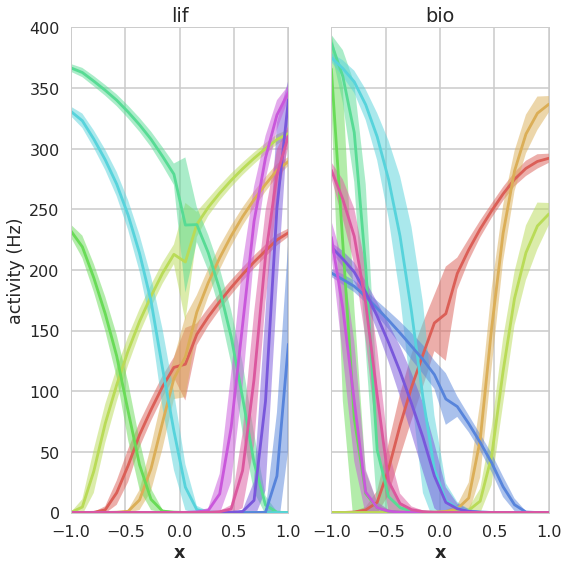

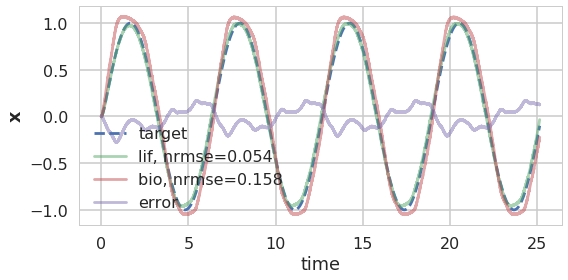

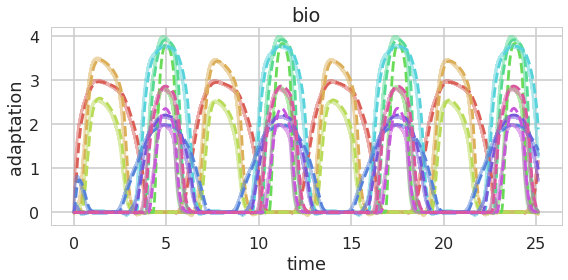

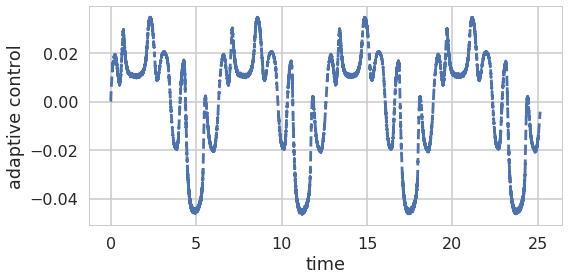

In [5]:
n_neurons = 100
n_pre = 100
n_adapt = 1
freq = 1
taus = {'network': 0.1, 'readout': 0.1}
neuron_type = nengo.AdaptiveLIF(tau_n=0.1, inc_n=0.01)
max_rates = Uniform(200, 400)

reg = 0.1
reg_adapt = 0.01
JL_dims = 0
JL_mag = 0
control_iterations = 10
delta_d = 1.0

t1 = 8*np.pi
t2 = 8*np.pi
t3 = 8*np.pi
t4 = 8*np.pi
t5 = 8*np.pi
signal = 'cos'

d_supv = np.zeros((n_neurons, 1))
d_bio = np.zeros((n_neurons, 1))
d_supv_adapt = np.zeros((n_neurons, n_neurons))
d_bio_adapt = np.zeros((n_neurons, n_neurons))
d_JL = np.random.RandomState(seed=1).randn(n_neurons, JL_dims) * JL_mag
d_adapt_bio = np.zeros((n_neurons, 1))

d_supv, _, d_supv_adapt, _, _ = simulate(  
    d_supv,
    d_bio,
    d_JL,
    d_supv_adapt,
    d_bio_adapt,
    d_adapt_bio,
    t=t1,
    n_neurons=n_neurons,
    n_adapt=n_adapt,
    signal=signal,
    freq=freq,
    taus=taus,
    reg=reg,
    neuron_type=neuron_type,
    max_rates=max_rates,
    plot_supv=False,
    plot_bio=False,
    sim_supv=True,
    sim_bio=False,
    update_decoders=True)

print "d_bio"
_, d_bio, _, d_bio_adapt, _ = simulate(  
    d_supv,
    d_bio,
    d_JL,
    d_supv_adapt,
    d_bio_adapt,
    d_adapt_bio,
    t=t2,
    n_neurons=n_neurons,
    n_adapt=n_adapt,
    signal=signal,
    freq=freq,
    taus=taus,
    reg=reg,
    neuron_type=neuron_type,
    max_rates=max_rates,
    plot_supv=False,
    plot_bio=False,
    sim_supv=True,
    sim_bio=True,
    update_decoders=True)

print "d_adapt_bio"
for i in range(control_iterations):
    print "control iteration %s" %i
    _, _, _, _, d_adapt_bio_new = simulate(  
        d_supv,
        d_bio,
        d_JL,
        d_supv_adapt,
        d_bio_adapt,
        d_adapt_bio,
        t=t3,
        n_neurons=n_neurons,
        n_adapt=n_adapt,
        signal=signal,
        freq=freq,
        taus=taus,
        reg=reg,
        reg_adapt=reg_adapt,
        neuron_type=neuron_type,
        max_rates=max_rates,
        plot_supv=False,
        plot_bio=True,
        sim_supv=False,
        sim_bio=True,
        update_decoders=True)

    d_adapt_bio += delta_d * d_adapt_bio_new

print "Testing ..."
_, _, _, _, _ = simulate(  
    d_supv,
    d_bio,
    d_JL,
    d_supv_adapt,
    d_bio_adapt,
    d_adapt_bio,
    t=t5,
    n_neurons=n_neurons,
    n_adapt=n_adapt,
    signal='cos',
    freq=freq,
    taus=taus,
    neuron_type=neuron_type,
    max_rates=max_rates,
    plot_bio=True,
    sim_bio=True)

Building finished in 0:00:01.                                                   
Simulating finished in 0:00:28.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...
d_bio
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:36.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...
d_adapt_bio
control iteration 0
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:27.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


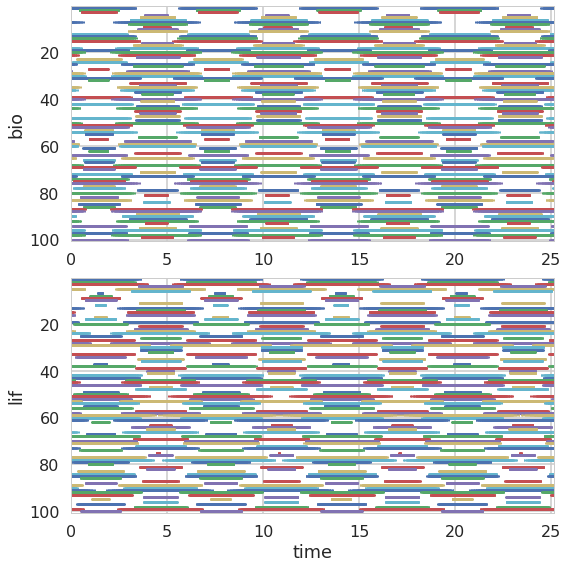

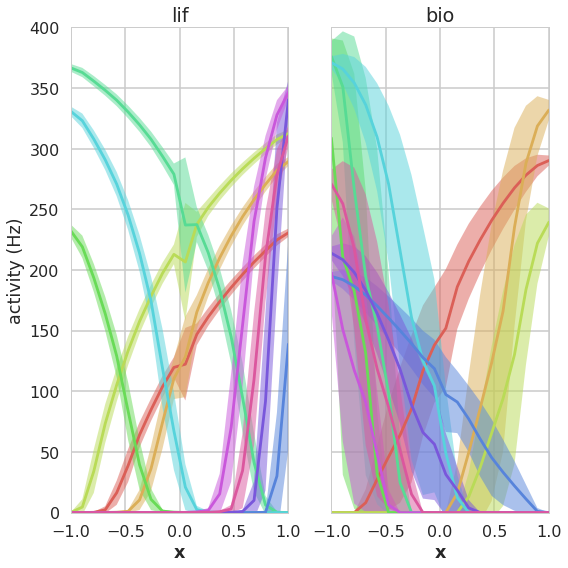

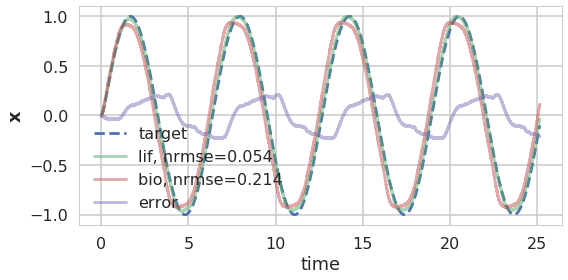

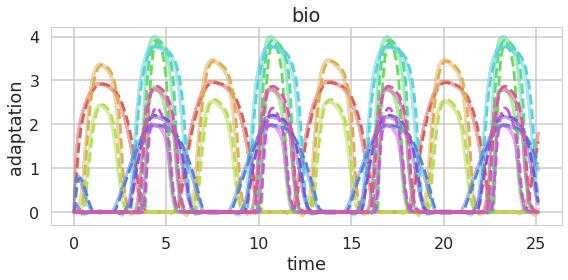

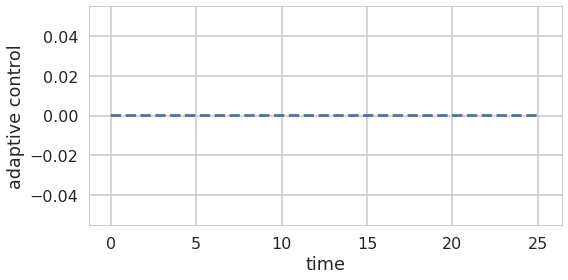

control iteration 1
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:24.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


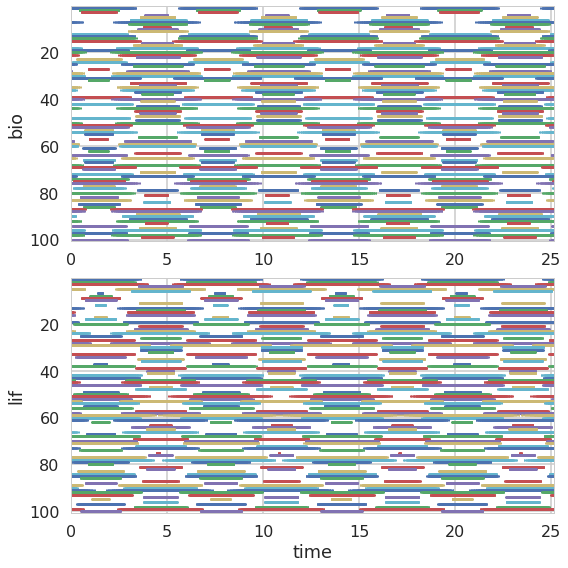

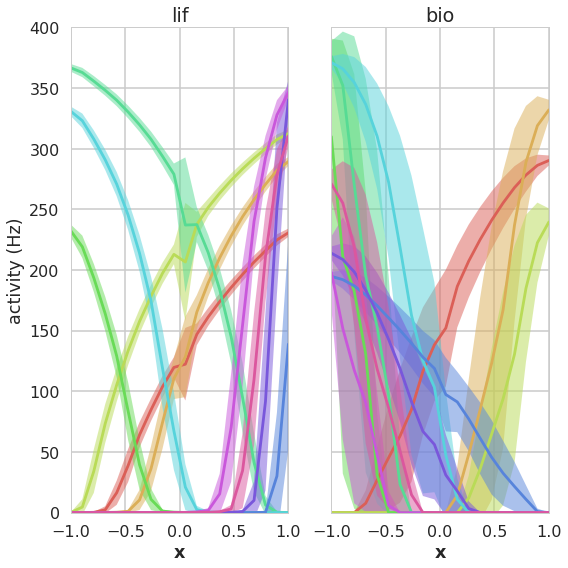

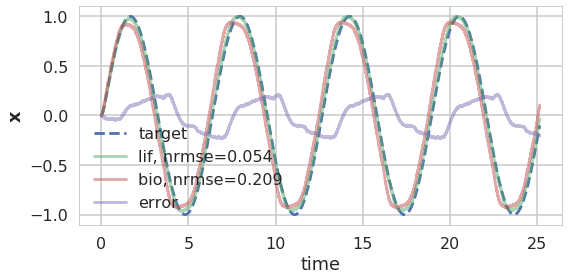

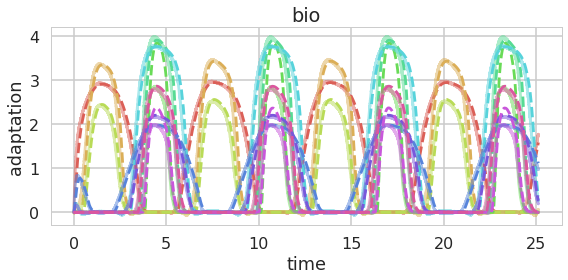

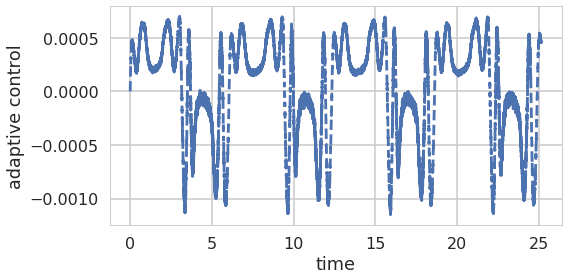

control iteration 2
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:27.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


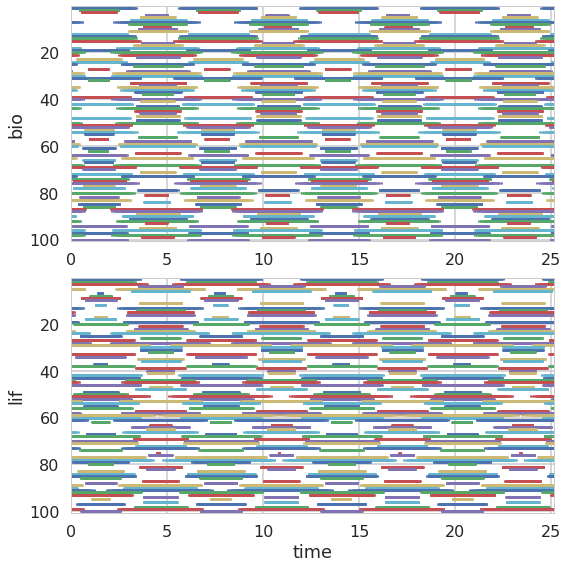

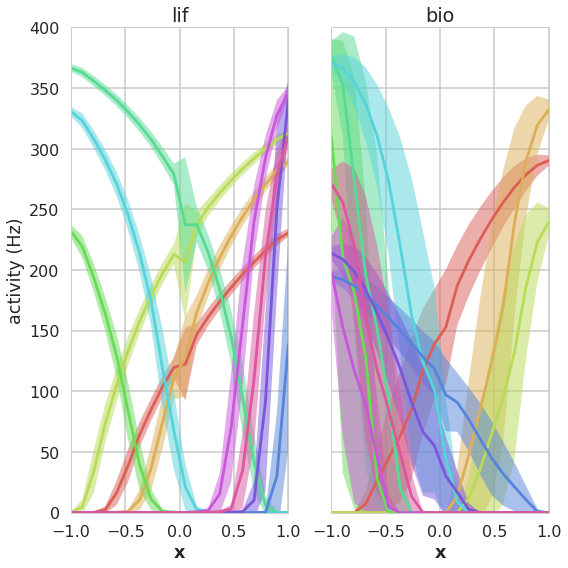

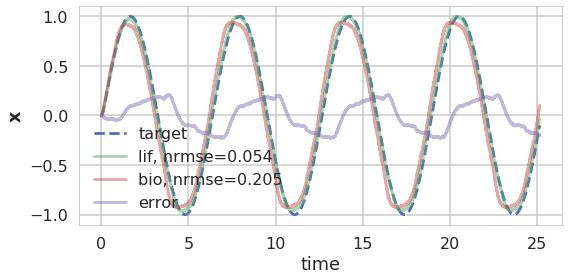

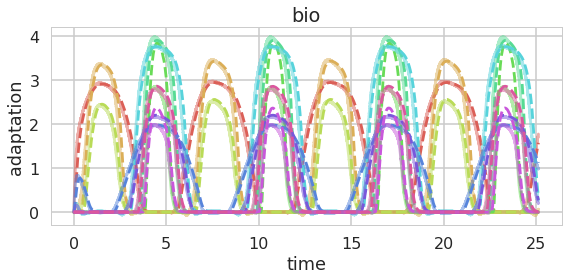

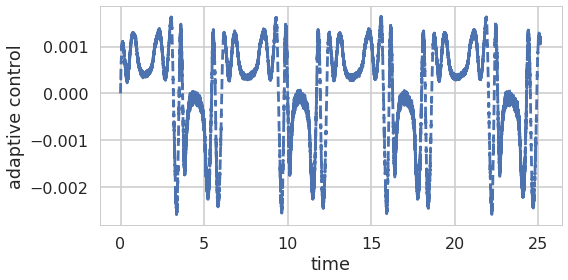

control iteration 3
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:29.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


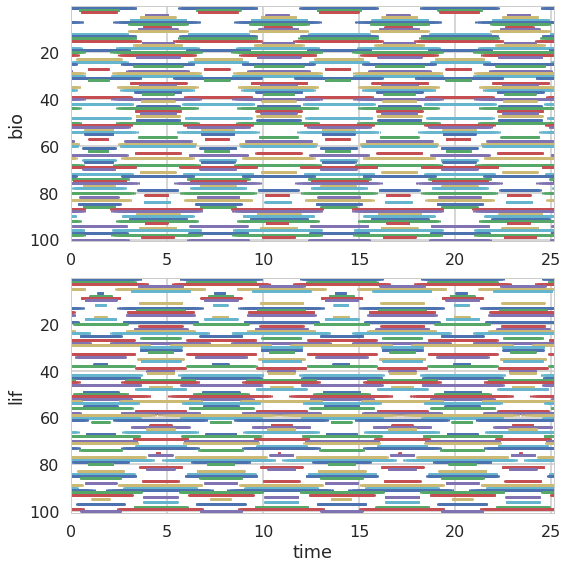

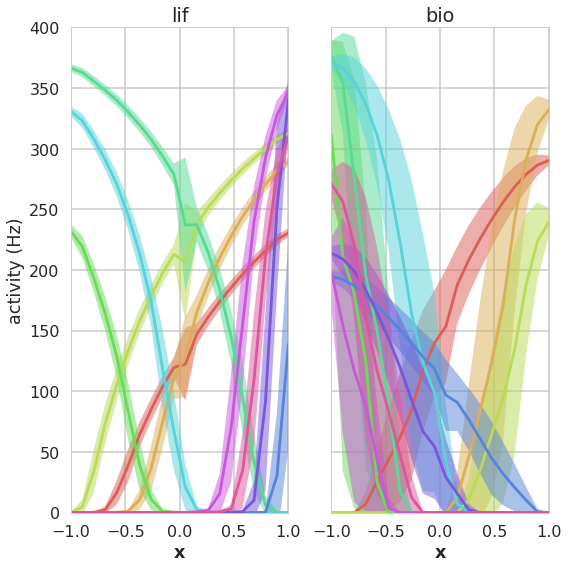

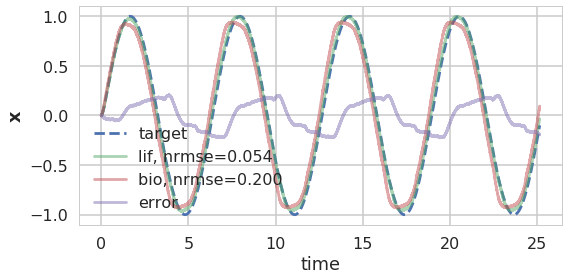

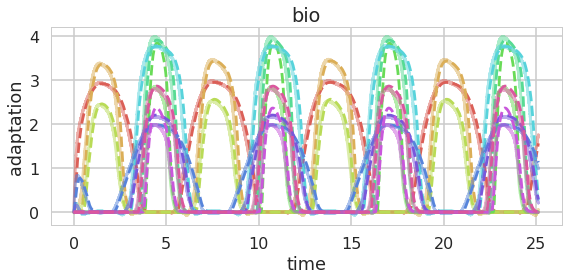

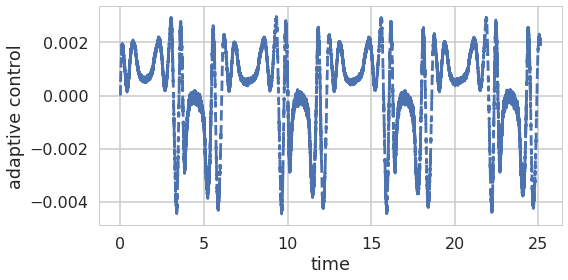

control iteration 4
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:28.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


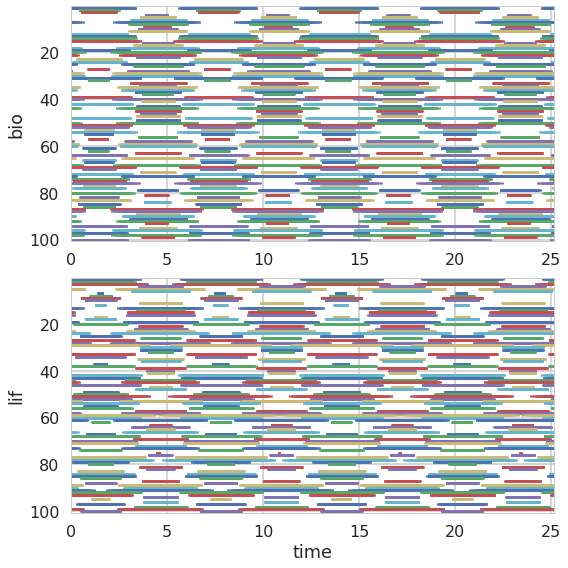

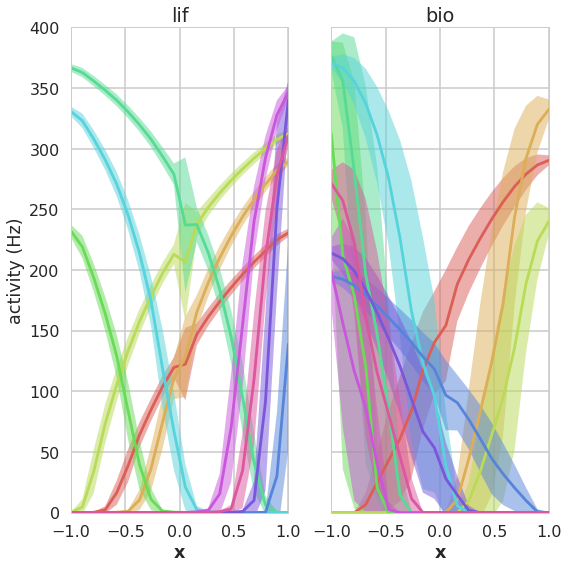

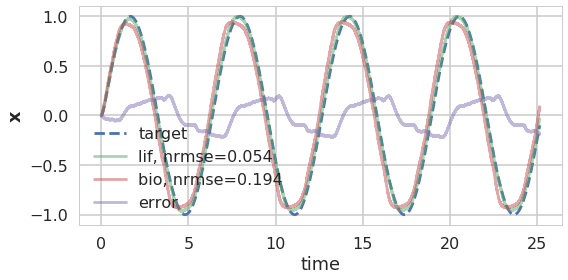

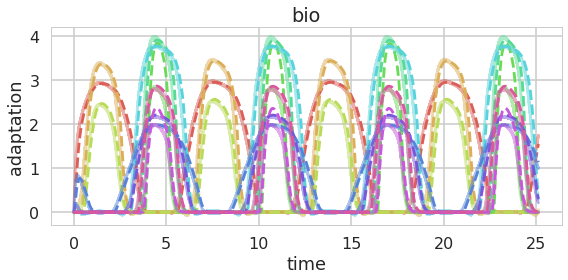

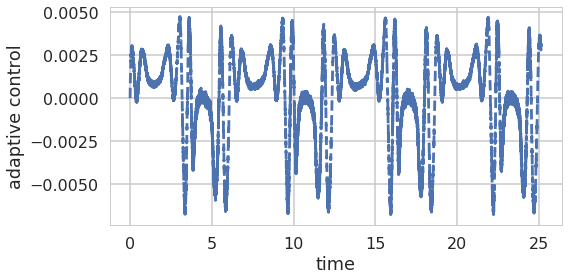

control iteration 5
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:28.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


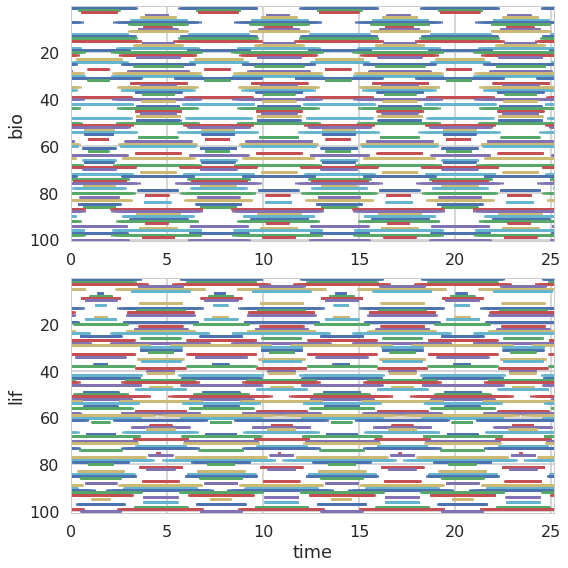

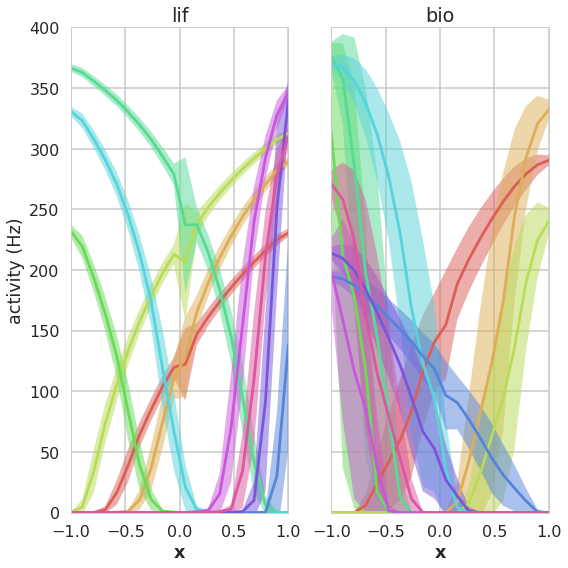

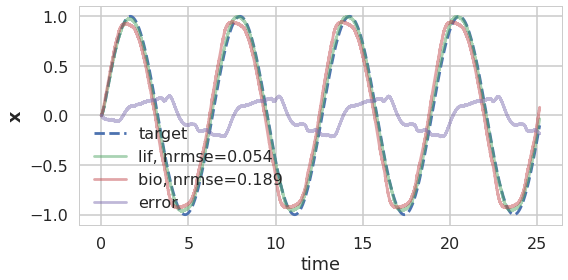

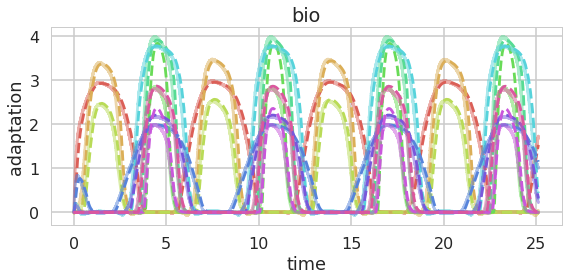

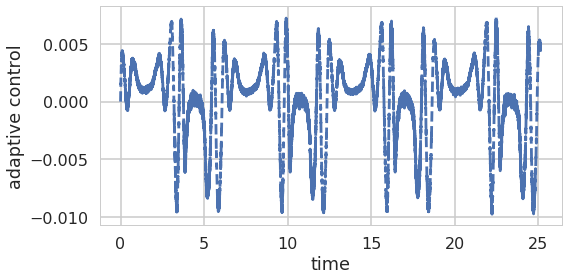

control iteration 6
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:32.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


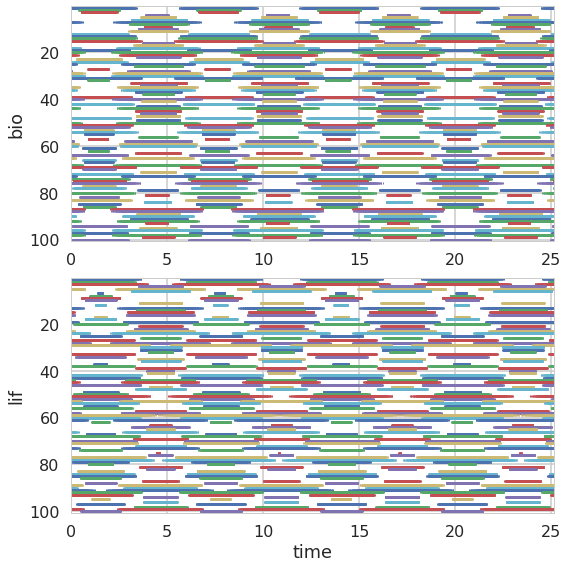

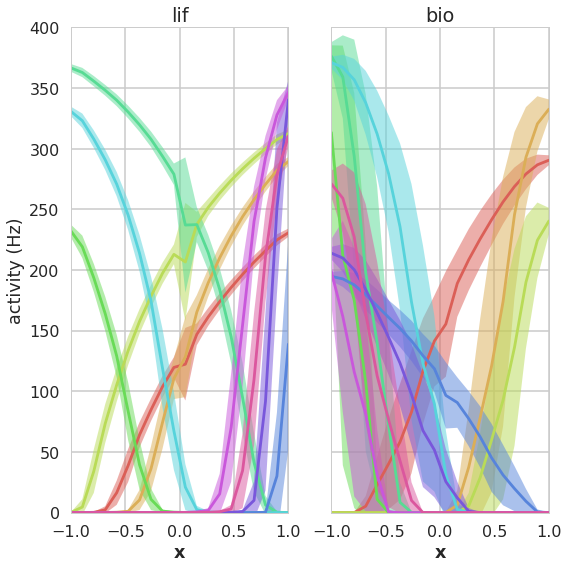

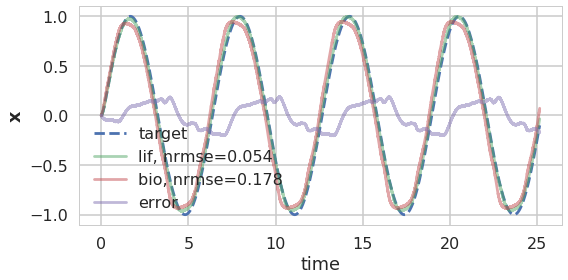

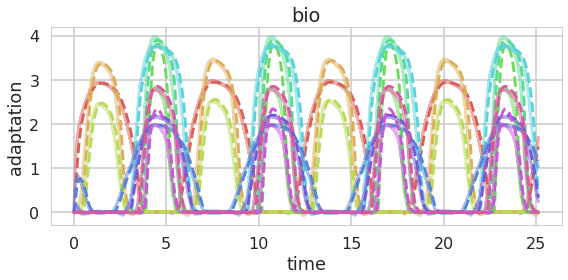

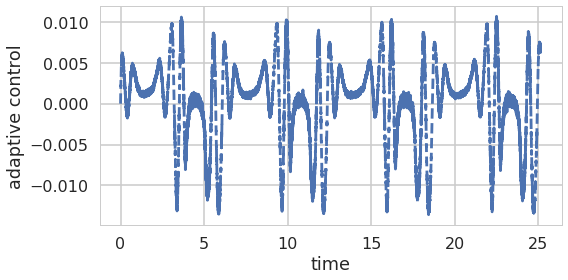

control iteration 7
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:28.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


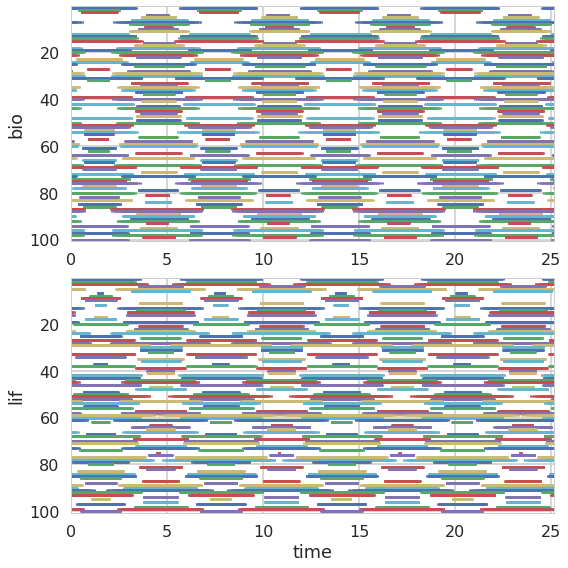

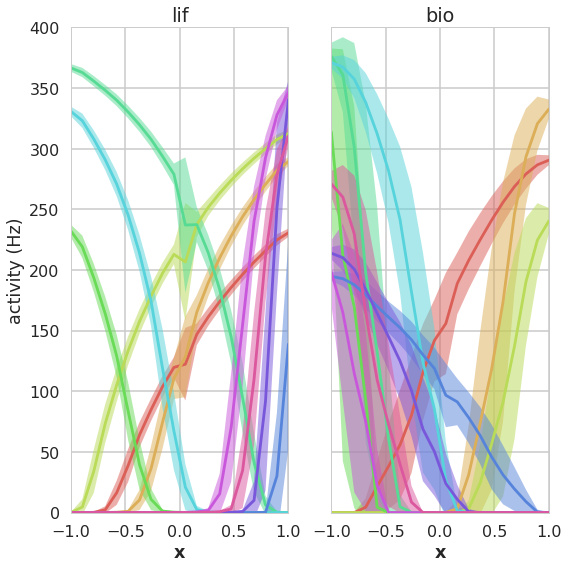

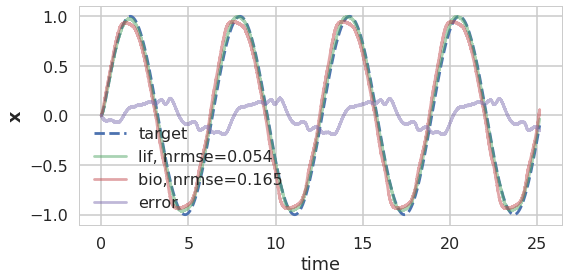

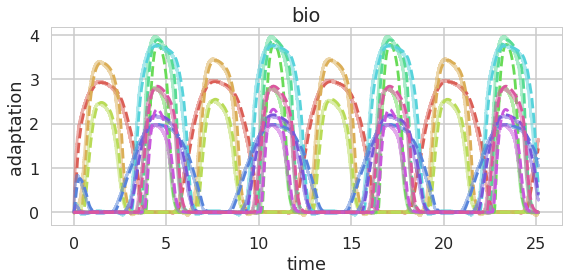

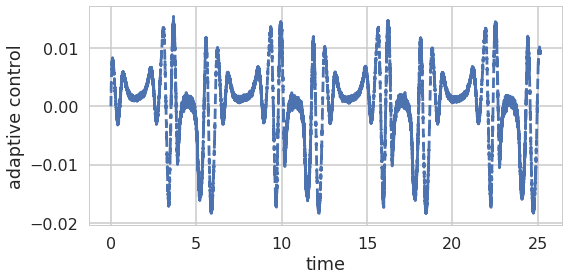

control iteration 8
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:25.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


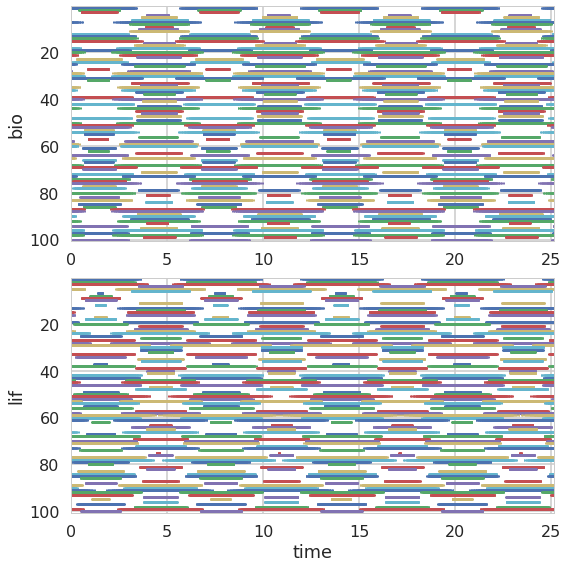

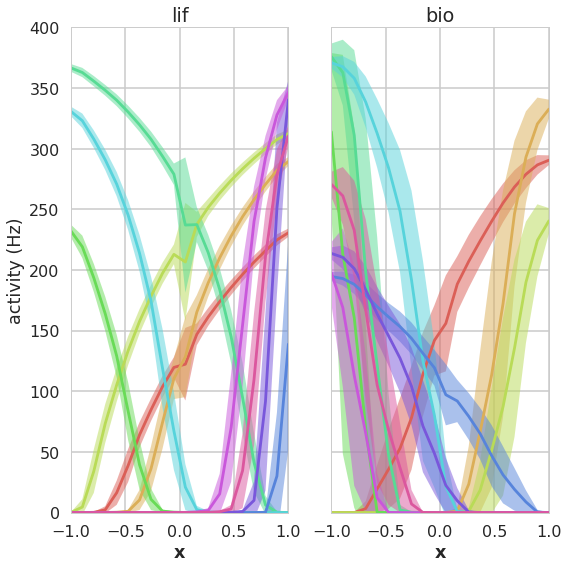

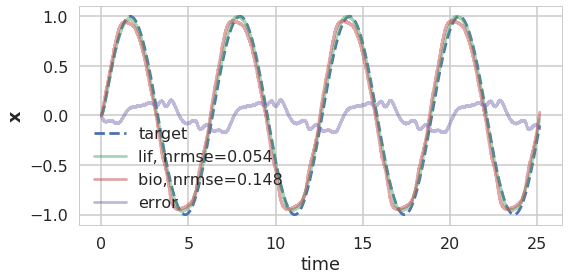

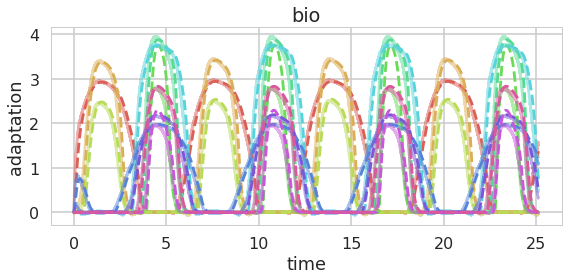

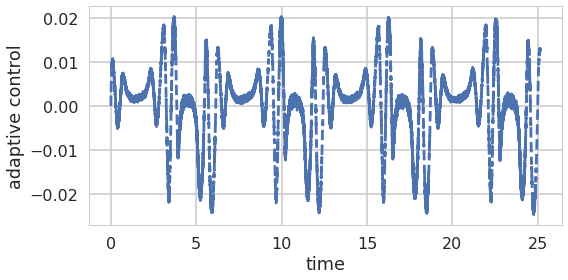

control iteration 9
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:24.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


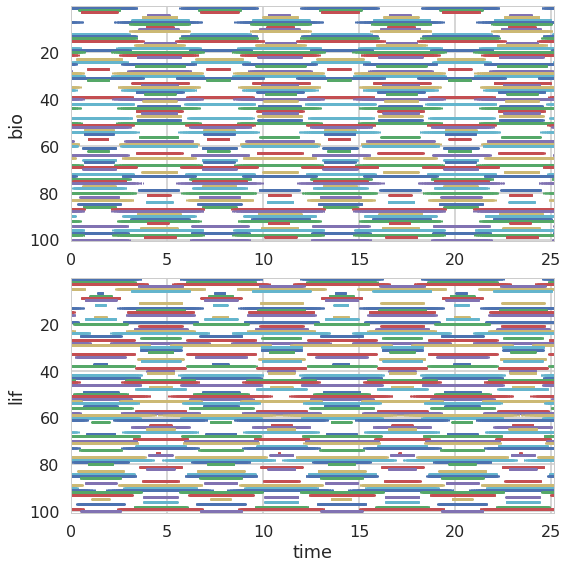

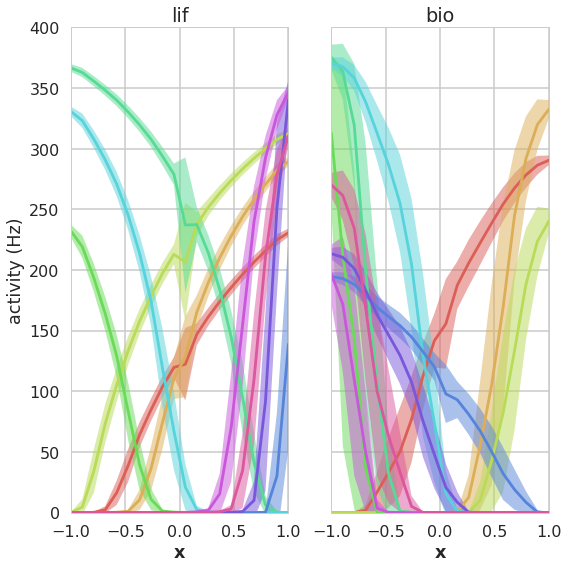

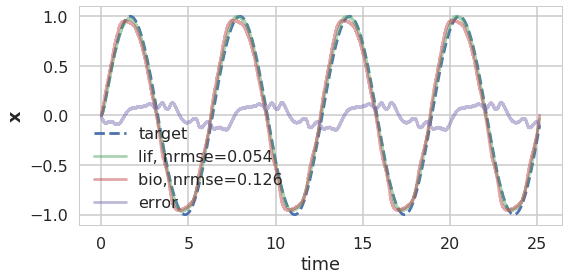

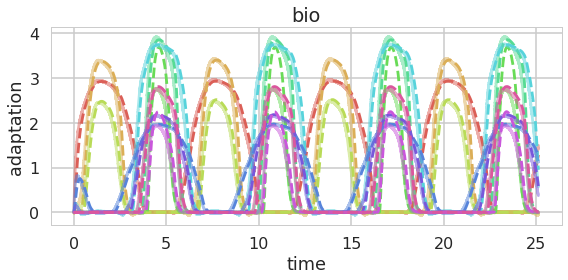

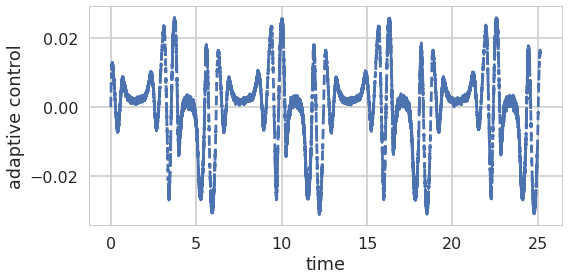

control iteration 10
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:30.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


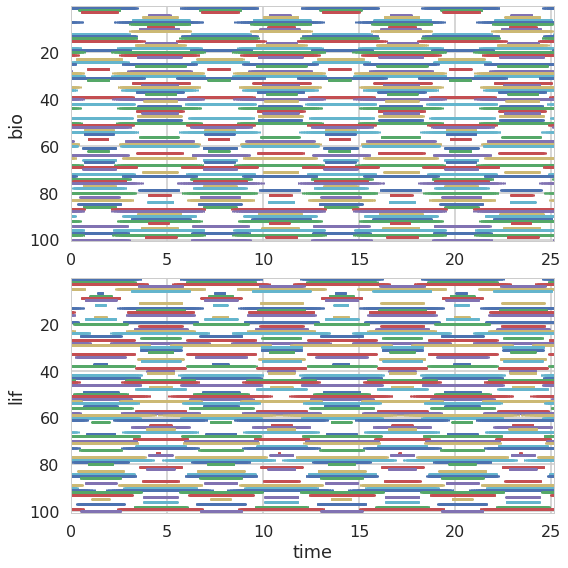

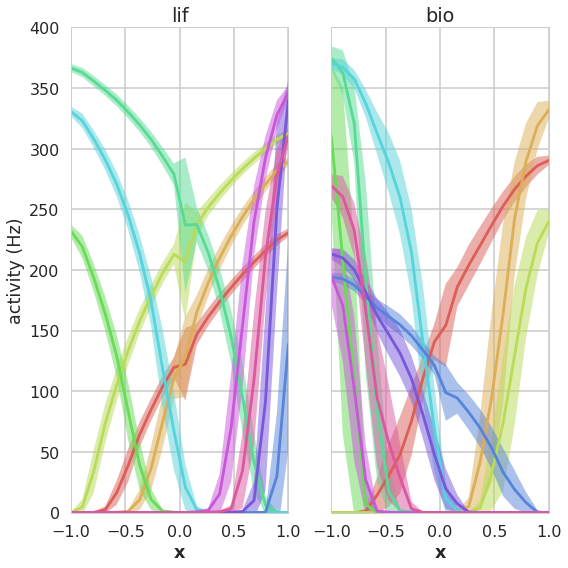

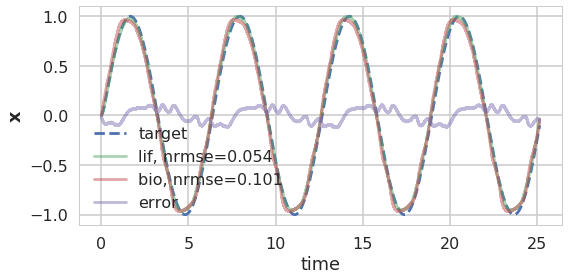

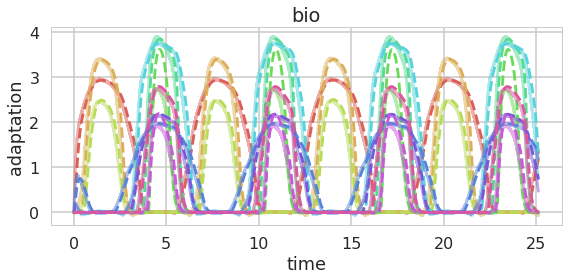

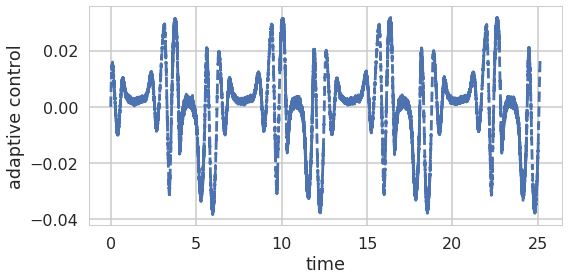

control iteration 11
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:26.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


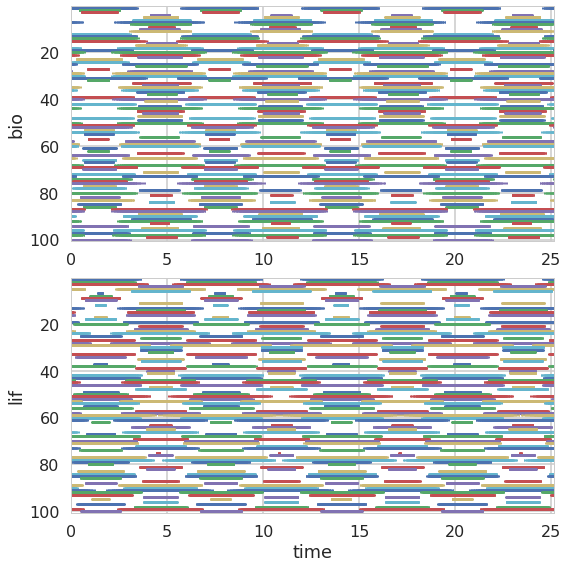

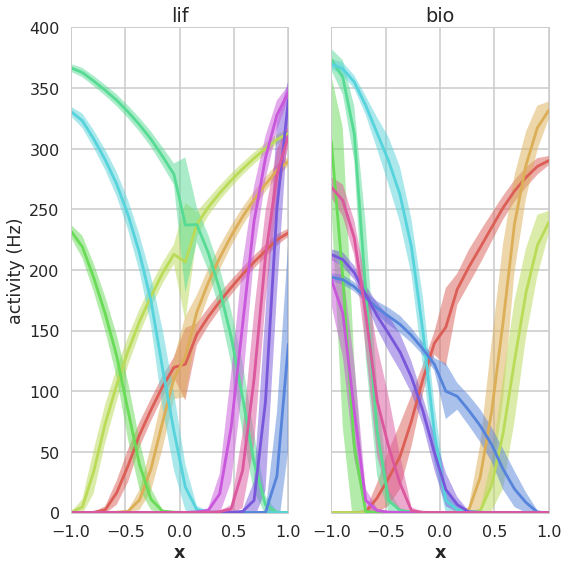

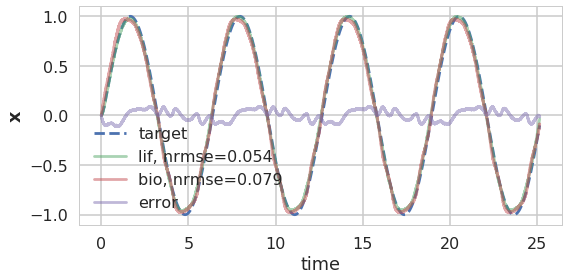

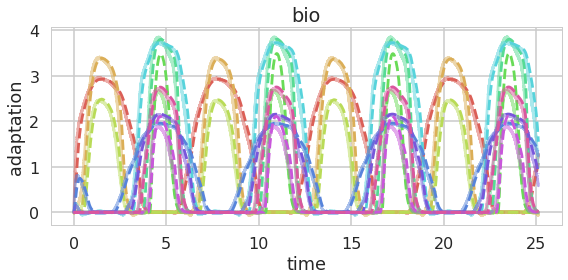

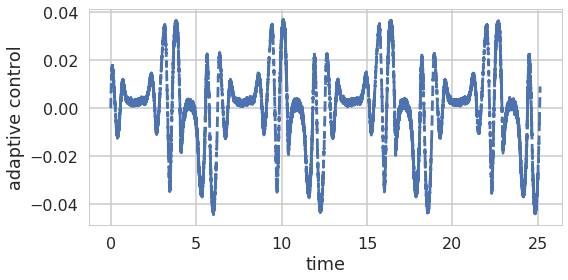

control iteration 12
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:25.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


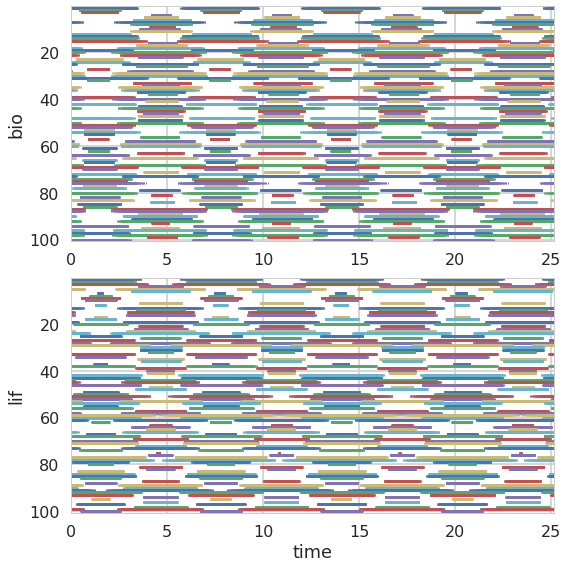

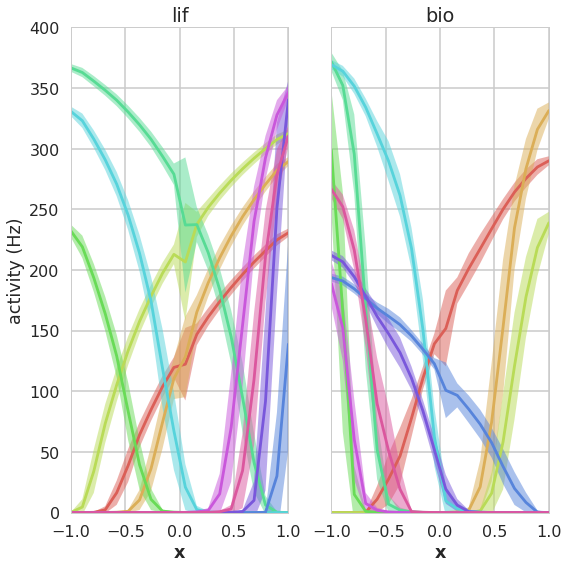

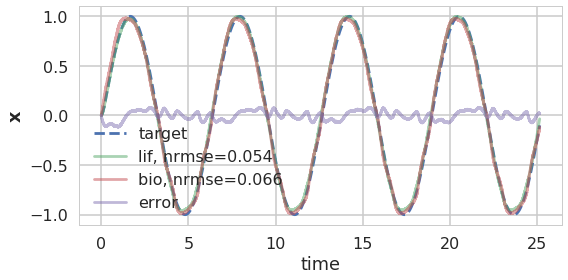

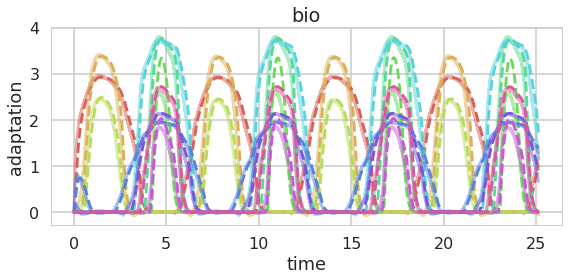

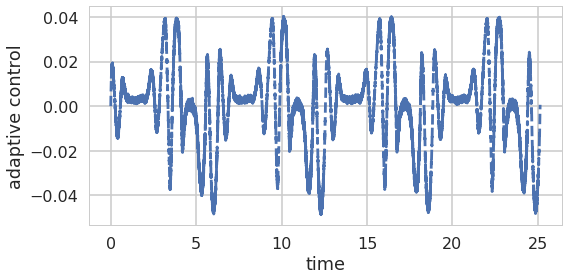

control iteration 13
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:25.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


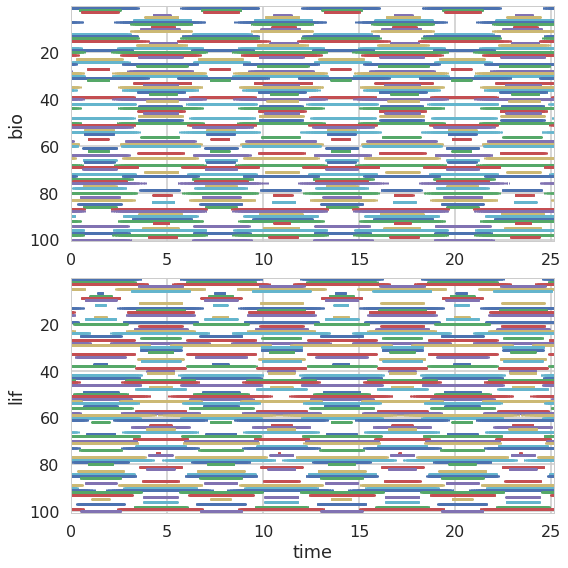

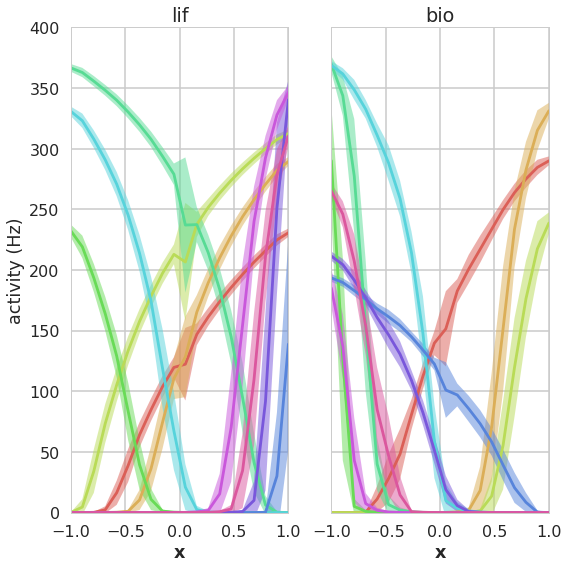

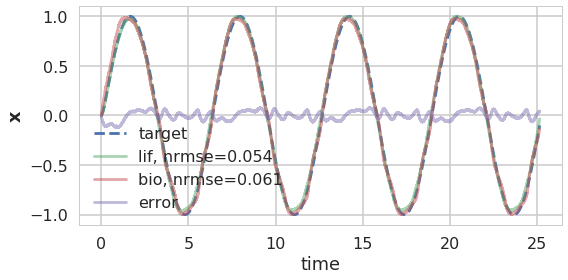

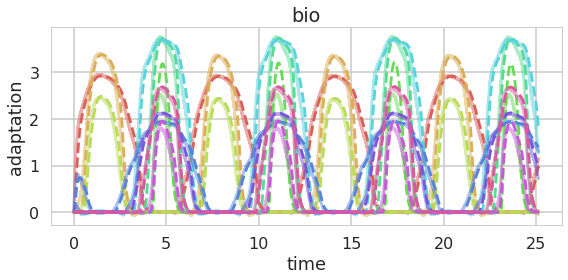

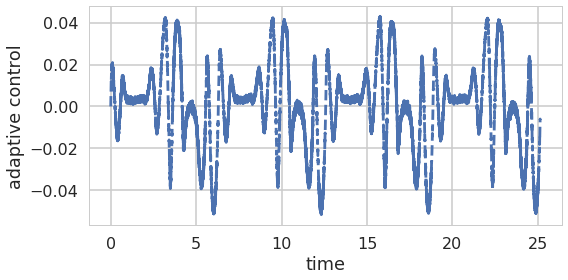

control iteration 14
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:22.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


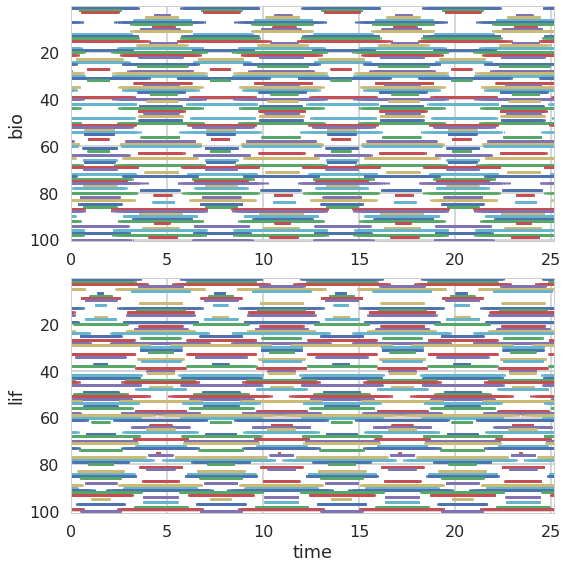

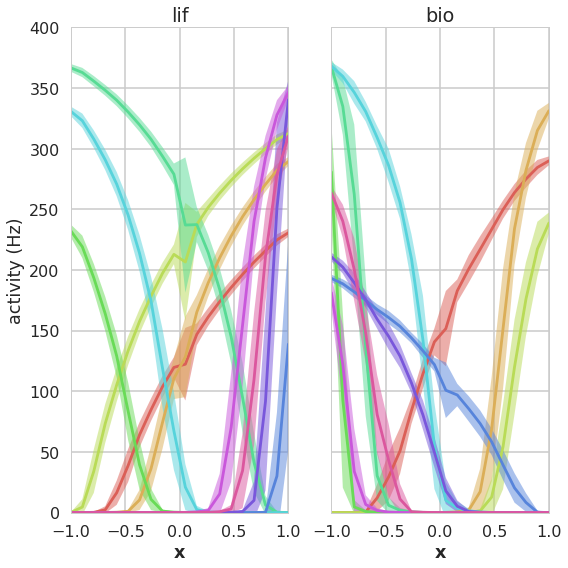

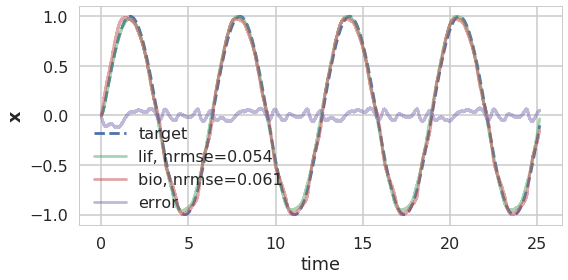

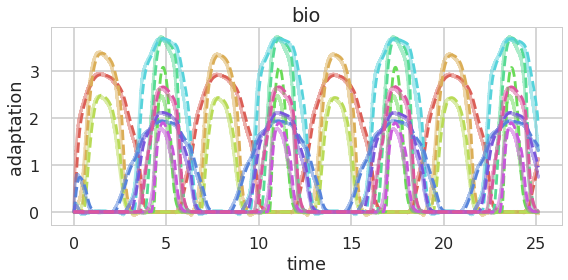

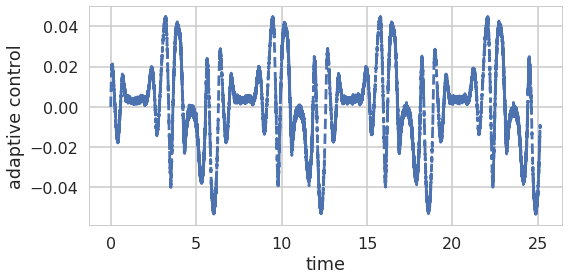

control iteration 15
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:29.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


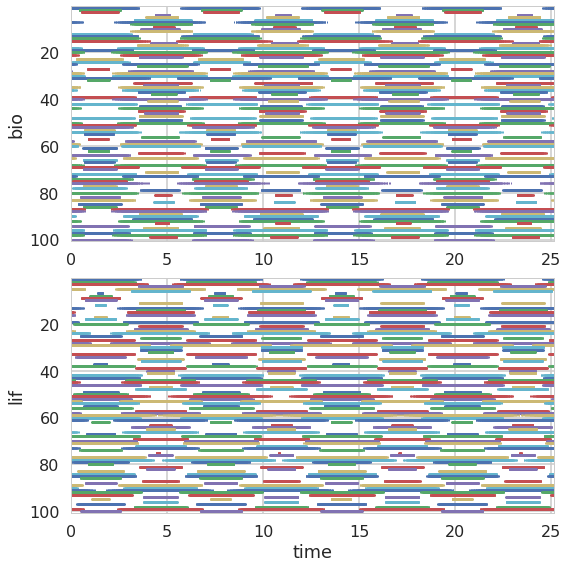

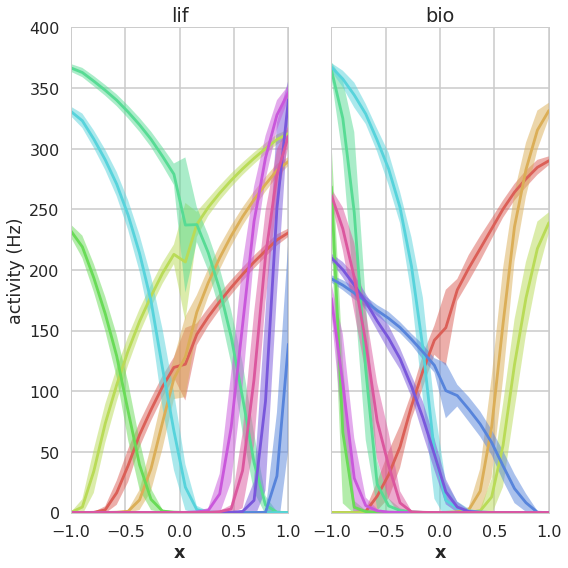

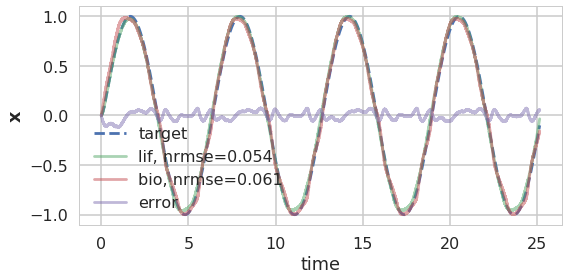

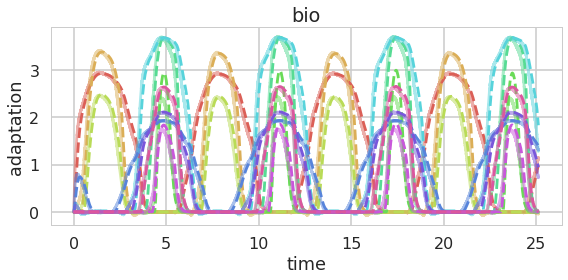

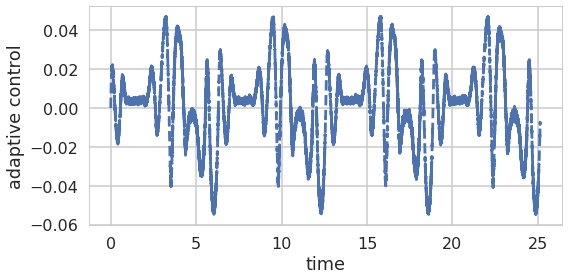

control iteration 16
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:27.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


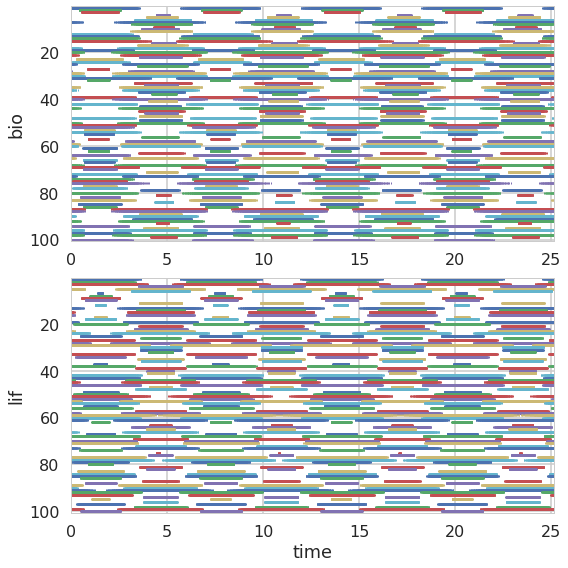

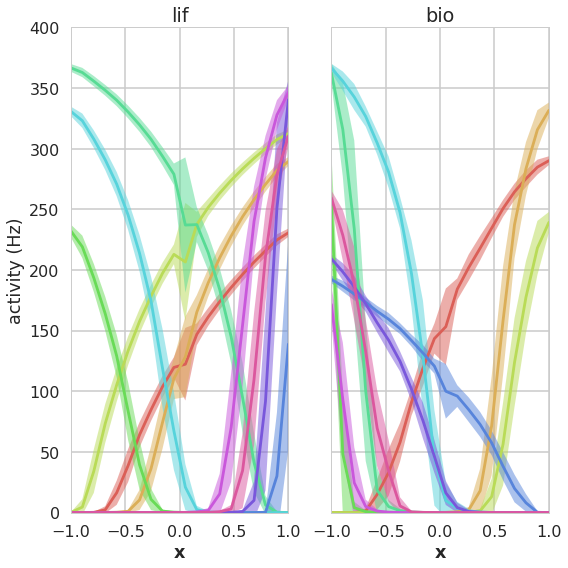

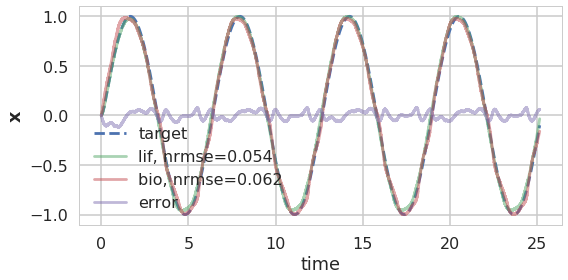

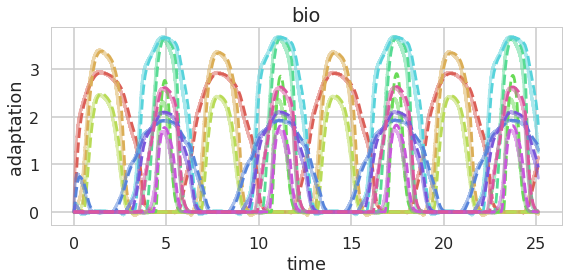

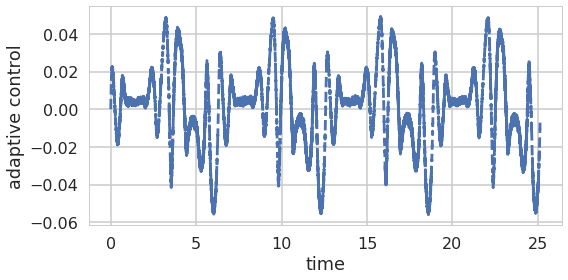

control iteration 17
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:21.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


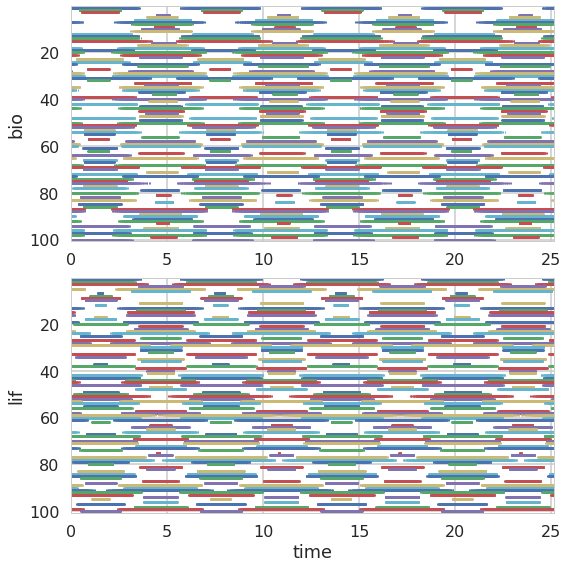

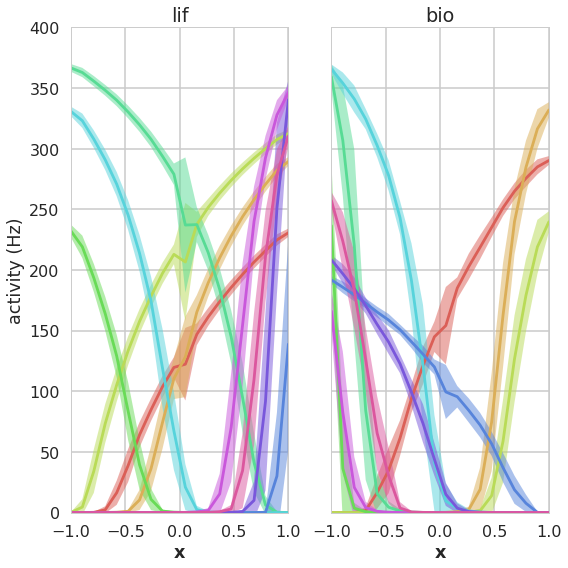

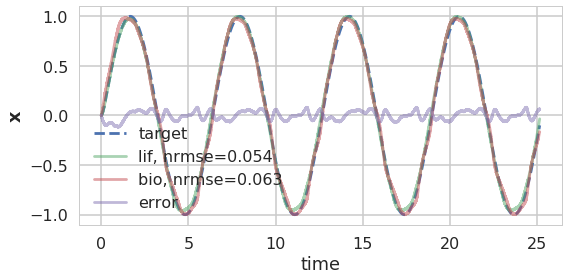

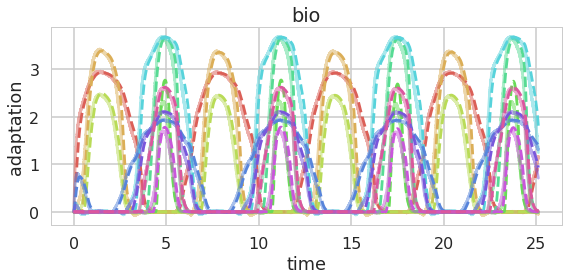

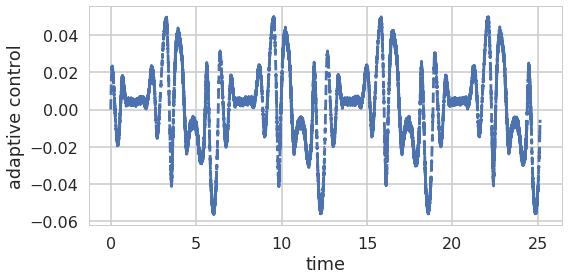

control iteration 18
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:22.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


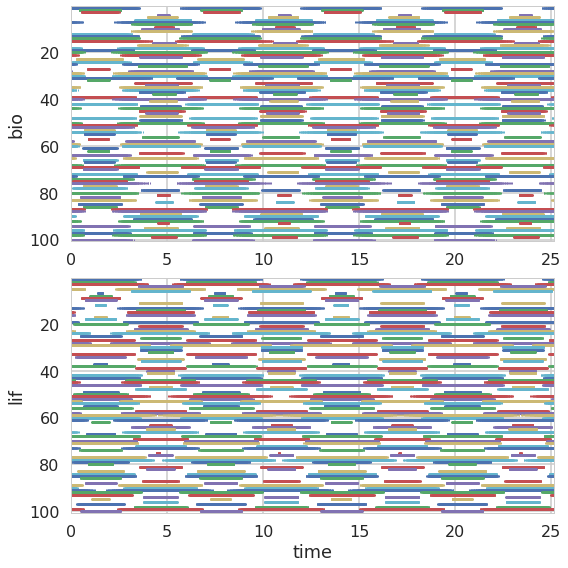

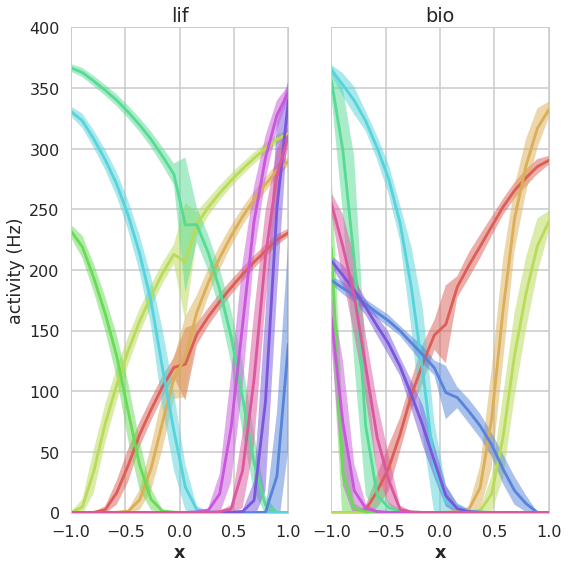

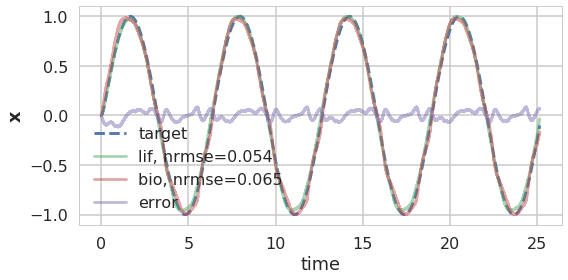

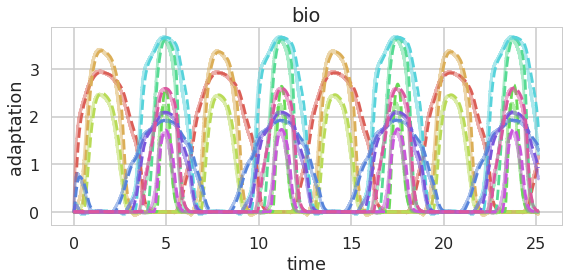

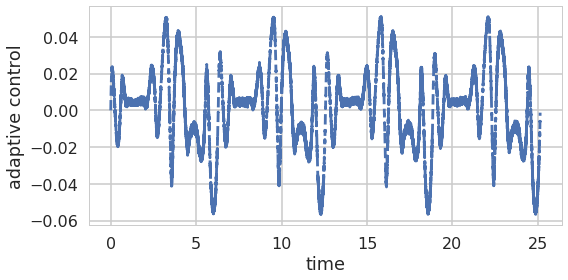

control iteration 19
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:22.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


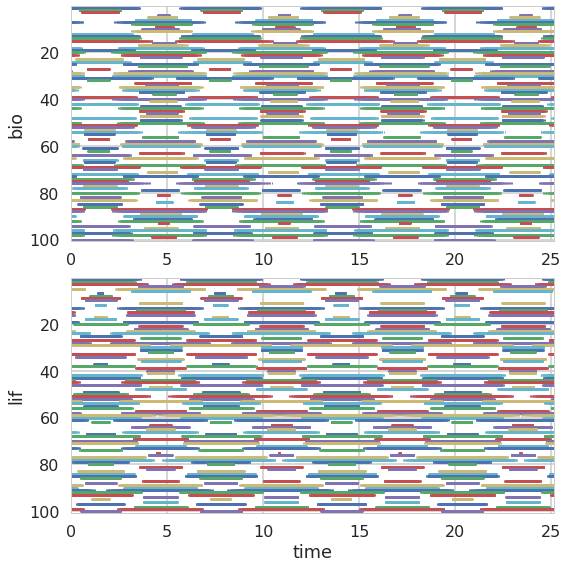

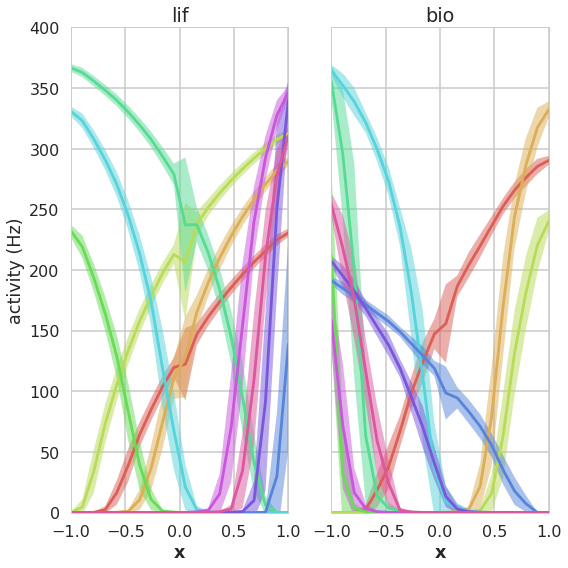

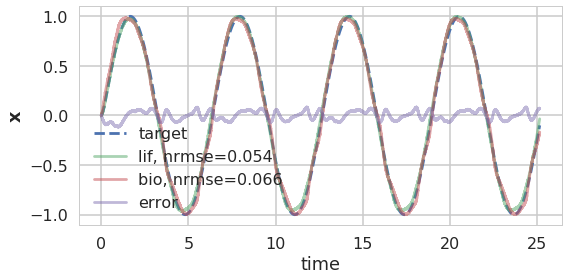

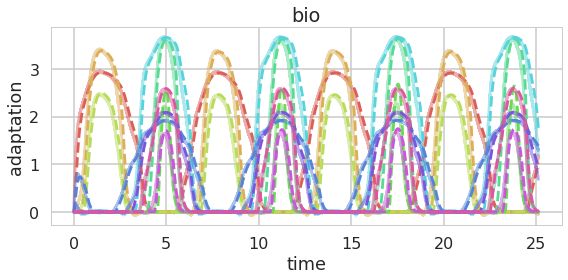

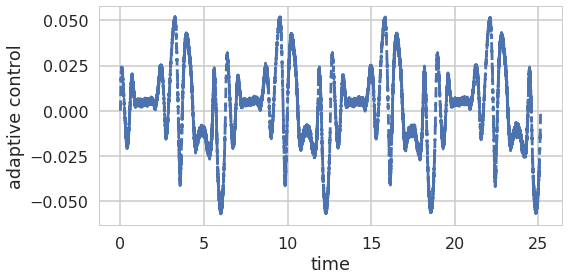

Testing ...
Building finished in 0:00:01.                                                   
Simulating finished in 0:00:29.                                                 
collecting simulation data ...
training and saving decoders and filters ...
computing xhat from updated decoders/filters ...
plotting ...


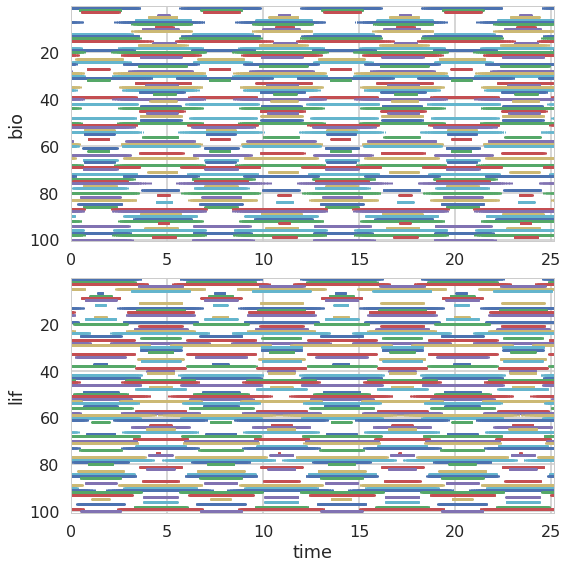

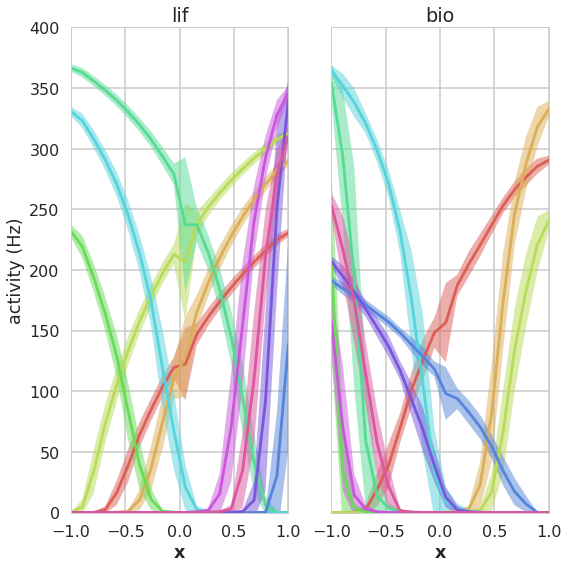

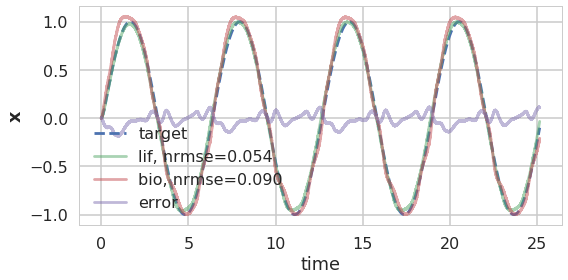

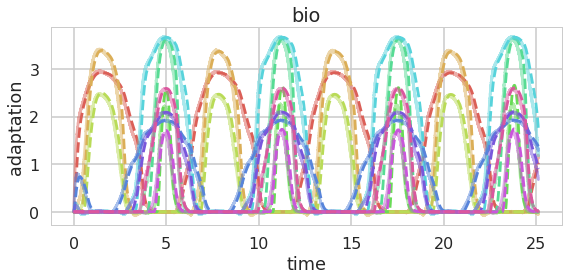

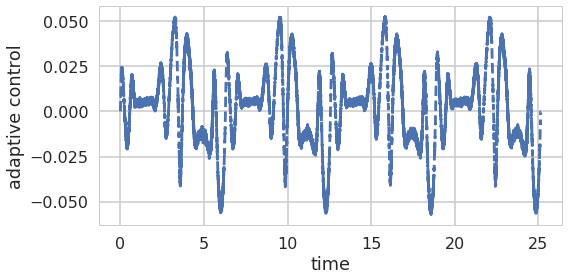

In [8]:
n_neurons = 100
n_pre = 100
n_adapt = 1
freq = 1
taus = {'network': 0.1, 'readout': 0.1}
neuron_type = nengo.AdaptiveLIF(tau_n=0.1, inc_n=0.01)
max_rates = Uniform(200, 400)

reg = 0.1
reg_adapt = 0.01
JL_dims = 0
JL_mag = 0
control_iterations = 20
delta_d = 0.2

t1 = 8*np.pi
t2 = 8*np.pi
t3 = 8*np.pi
t4 = 8*np.pi
t5 = 8*np.pi
signal = 'cos'

d_supv = np.zeros((n_neurons, 1))
d_bio = np.zeros((n_neurons, 1))
d_supv_adapt = np.zeros((n_neurons, n_neurons))
d_bio_adapt = np.zeros((n_neurons, n_neurons))
d_JL = np.random.RandomState(seed=1).randn(n_neurons, JL_dims) * JL_mag
d_adapt_bio = np.zeros((n_neurons, 1))

d_supv, _, d_supv_adapt, _, _ = simulate(  
    d_supv,
    d_bio,
    d_JL,
    d_supv_adapt,
    d_bio_adapt,
    d_adapt_bio,
    t=t1,
    n_neurons=n_neurons,
    n_adapt=n_adapt,
    signal=signal,
    freq=freq,
    taus=taus,
    reg=reg,
    neuron_type=neuron_type,
    max_rates=max_rates,
    plot_supv=False,
    plot_bio=False,
    sim_supv=True,
    sim_bio=False,
    update_decoders=True)

print "d_bio"
_, d_bio, _, d_bio_adapt, _ = simulate(  
    d_supv,
    d_bio,
    d_JL,
    d_supv_adapt,
    d_bio_adapt,
    d_adapt_bio,
    t=t2,
    n_neurons=n_neurons,
    n_adapt=n_adapt,
    signal=signal,
    freq=freq,
    taus=taus,
    reg=reg,
    neuron_type=neuron_type,
    max_rates=max_rates,
    plot_supv=False,
    plot_bio=False,
    sim_supv=True,
    sim_bio=True,
    update_decoders=True)

print "d_adapt_bio"
for i in range(control_iterations):
    print "control iteration %s" %i
    _, _, _, _, d_adapt_bio_new = simulate(  
        d_supv,
        d_bio,
        d_JL,
        d_supv_adapt,
        d_bio_adapt,
        d_adapt_bio,
        t=t3,
        n_neurons=n_neurons,
        n_adapt=n_adapt,
        signal=signal,
        freq=freq,
        taus=taus,
        reg=reg,
        reg_adapt=reg_adapt,
        neuron_type=neuron_type,
        max_rates=max_rates,
        plot_supv=False,
        plot_bio=True,
        sim_supv=False,
        sim_bio=True,
        update_decoders=True)

    d_adapt_bio += delta_d * d_adapt_bio_new

print "Testing ..."
_, _, _, _, _ = simulate(  
    d_supv,
    d_bio,
    d_JL,
    d_supv_adapt,
    d_bio_adapt,
    d_adapt_bio,
    t=t5,
    n_neurons=n_neurons,
    n_adapt=n_adapt,
    signal='cos',
    freq=freq,
    taus=taus,
    neuron_type=neuron_type,
    max_rates=max_rates,
    plot_bio=True,
    sim_bio=True)